
# Image Segmentation Tutorial with the MosMedData Dataset for infection segmentation

Introduction
In this tutorial, we introduce an end-to-end training and evaluation example based on the MosMedData dataset.
We'll go through the following steps:

- Create a Custom Dataset for training and testing
- Use albumentations transforms to pre-process data
- Train the model with a PyTorch program
- Evaluate on test dataset
- Use Segmentation-Models Module
- Use Unet(with ResNet18 BackBone)

### Get the dataset
https://mosmed.ai/en/

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os
import glob
from sklearn.utils import shuffle
from tqdm import tqdm_notebook
import pandas as pd
import numpy as np
import nibabel as nib
from scipy.ndimage import gaussian_filter as gf
from scipy import ndimage
import matplotlib.pyplot as plt
from skimage.transform import resize
import cv2

#Unzip raw data into the "infec"

# Prepare Data format with below format and structure:
1. Create 2 sub-folder: **imagesTr and labelsTr** (for train and validation set)
2. Transforming 3D data to 2D slices and save with npz format(for example 05_23.npz In such a way that the first number indicates the subject number and the second number indicates the slice number) with array name -> img 
3. The images must be in the imagesTr folder
4. The segmentation masks must be in the labelsTr folder
5. The test-set must be in the imagesTe and labelsTe folders if If we have a test set

In [ ]:
def save_npz():
  dataset_list = ['/content/drive/MyDrive/AI-Medic/Prostate/Task05_Prostate/']

  for dataset in dataset_list:
      for i in range(0,int(50)+1):
          try:
            path_tr = dataset + 'imagesTr/'
            path_lb = dataset + 'labelsTr/'
            num = str(i)
            if len(num) == 1:
              num = '0' + num
            img  = nib.load(path_tr+'prostate_'+num+'.nii.gz').get_fdata()
            mask = nib.load(path_lb+'prostate_'+num+'.nii.gz').get_fdata()
            # nii_data = np.rot90(img.get_fdata(),3, axes=(0,1))
            # img[img<-1024]=-1024
            for j in range(img.shape[2]):
                img0 = np.array(img[:,:,j,0],dtype='float64')
                img0 = cv2.resize(img0, (256,256), interpolation=cv2.INTER_NEAREST)
                img1 = np.array(img[:,:,j,1],dtype='float64')
                img1 = cv2.resize(img1, (256,256),interpolation=cv2.INTER_NEAREST)
                mask0 = np.array(mask[:,:,j],dtype='int8')
                mask0 = cv2.resize(mask0, (256,256),interpolation=cv2.INTER_NEAREST)
                np.savez_compressed('/content/drive/MyDrive/AI-Medic/Prostate/2D_Seg_Test/Data_Train/' + 'img_'+str(i).zfill(2)+ '_slice_' +str(j).zfill(2)+'.npz',img_0=img0,img_1 =img1,mask=mask0 )
            print(path_tr , '-', i,'Train',img0.shape, img1.shape, mask0.shape)
          except:
            pass
          try:
            path_ts = dataset + 'imagesTs/'
            num = str(i)
            if len(num) == 1:
              num = '0' + num
            img  = nib.load(path_ts+'prostate_'+num+'.nii.gz').get_fdata()
            # nii_data = np.rot90(img.get_fdata(),3, axes=(0,1))
            # img[img<-1024]=-1024
            for j in range(img.shape[2]):
                img0 = np.array(img[:,:,j,0],dtype='float64')
                img0 = cv2.resize(img0, (256,256),interpolation=cv2.INTER_NEAREST)
                img1 = np.array(img[:,:,j,1],dtype='float64')
                img1 = cv2.resize(img1, (256,256),interpolation=cv2.INTER_NEAREST)
                np.savez_compressed('/content/drive/MyDrive/AI-Medic/Prostate/2D_Seg_Test/Data_Test/' + 'img_'+str(i).zfill(2)+ '_slice_' +str(j).zfill(2)+'.npz',img_0=img0,img_1=img1 )
            print(path_ts , '-', i,'Test',img0.shape, img1.shape)
          except:
            pass   
          # print(dataset , '-', i,nii_data.shape)
          # for j in range(nii_mask.shape[2]):
          #     img0 = np.array(np.round(nii_data[:,:,j],0),dtype='int16')
          #     mask0 = np.array(nii_mask[:,:,j],dtype='bool')

          #     np.savez_compressed('/content/infec/imagesTr/' + str(i).zfill(2)+ '_' +str(j).zfill(3)+'.npz',img=img0 )
          #     np.savez_compressed('/content/infec/labelsTr/' + str(i).zfill(2)+ '_' +str(j).zfill(3)+'.npz',img=mask0)



In [ ]:
# save_npz()

In [ ]:
def mask_percent():
  slices_path = next(os.walk('/content/drive/MyDrive/AI-Medic/Prostate/2D_Seg_Test/Data_Train/'))[-1]
  path = '/content/drive/MyDrive/AI-Medic/Prostate/2D_Seg_Test/Data_Train/'
  slices_path = [path + name for name in slices_path]
  total = len(slices_path)
  true_1 = 0
  true_2 = 0
  for i in slices_path:
    mask_img = np.load(i)['mask']
    if 1 in mask_img:
      true_1 += 1
    if 2 in mask_img:
      true_2 += 1
  print('label 1 percentage: ', (true_1/total) * 100)
  print('label 2 percentage: ', (true_2/total) * 100)

In [ ]:
# mask_percent()

#Install segmentation-models-pytorch

In [ ]:
# !pip -q install monai
# !pip -q install 'monai[all]'
!pip install segmentation-models-pytorch
!pip install git+https://github.com/qubvel/segmentation_models.pytorch

     |████████████████████████████████| 87 kB 5.0 MB/s 
     |████████████████████████████████| 58 kB 7.8 MB/s 
     |████████████████████████████████| 376 kB 38.8 MB/s 
  Created wheel for efficientnet-pytorch: filename=efficientnet_pytorch-0.6.3-py3-none-any.whl size=12419 sha256=4d72426f711025df38861ecd15374505923865d668cf388802b68ff647668463
  Stored in directory: /root/.cache/pip/wheels/90/6b/0c/f0ad36d00310e65390b0d4c9218ae6250ac579c92540c9097a
  Created wheel for pretrainedmodels: filename=pretrainedmodels-0.7.4-py3-none-any.whl size=60965 sha256=8d0caa74e22ca278986f8ed32f1a38223e0c8763cd4cb316219f82f33ff34a17
  Stored in directory: /root/.cache/pip/wheels/ed/27/e8/9543d42de2740d3544db96aefef63bda3f2c1761b3334f4873
Successfully built efficientnet-pytorch pretrainedmodels
  Cloning https://github.com/qubvel/segmentation_models.pytorch to /tmp/pip-req-build-7n2anya9
  Running command git clone -q https://github.com/qubvel/segmentation_models.pytorch /tmp/pip-req-build-7n2anya9


In [ ]:
# all_pxs = np.array([])
# label = np.load('/content/drive/MyDrive/AI-Medic/Prostate/2D_Seg_Test/Data_Train/img_00_slice_00.npz')['mask']
# img = np.load('/content/drive/MyDrive/AI-Medic/Prostate/2D_Seg_Test/Data_Train/img_00_slice_00.npz')['img_0']
# fig1 = plt.figure(1)
# plt.imshow(label)
# x,y = np.where(label==1)
# x1,y1 = np.where(label==2)
# print('x:', np.min(x), np.min(x1))
# print('y:', np.min(y), np.min(y1))
# MIN = (min(np.min(x1),np.min(x)), min(np.min(y1),np.min(y)))
# MAX = (max(np.max(x1),np.max(x)), max(np.max(y1),np.max(y)))
# print(MIN,MAX)
# print('x:', MIN[0],MAX[0])
# print('y:', MIN[1],MAX[1])
# new_label = label[MIN[0]:MAX[0]+1, MIN[1]:MAX[1]+1]
# fig2 = plt.figure(2)
# plt.imshow(new_label)

# img_crp = img[MIN[0]:MAX[0]+1, MIN[1]:MAX[1]+1]
# img_crp_flat = img_crp.flatten()
# all_pxs = np.append(all_pxs, img_crp_flat, axis=0)
# # print(all_px)
# fig3 = plt.figure(3)
# plt.imshow(img_crp)

In [ ]:
def make_all_px():
  all_px = np.array([])

  train_slices = next(os.walk('/content/drive/MyDrive/AI-Medic/Prostate/2D_Seg_Test/Data_Train/'))[-1]
  path = '/content/drive/MyDrive/AI-Medic/Prostate/2D_Seg_Test/Data_Train/'
  for Tslice in train_slices:
    img = np.load('/content/drive/MyDrive/AI-Medic/Prostate/2D_Seg_Test/Data_Train/'+Tslice)['img_0']
    label = np.load('/content/drive/MyDrive/AI-Medic/Prostate/2D_Seg_Test/Data_Train/'+Tslice)['mask']
    x,y = np.where(label==1)
    x1,y1 = np.where(label==2)
    try:
      MIN = (min(np.min(x1),np.min(x)), min(np.min(y1),np.min(y)))
      MAX = (max(np.max(x1),np.max(x)), max(np.max(y1),np.max(y)))
      img_crp = img[MIN[0]:MAX[0]+1, MIN[1]:MAX[1]+1]
      img_crp_flat = img_crp.flatten()
      all_px = np.append(all_px, img_crp_flat, axis=0)
    except:
      pass

    return all_px


In [ ]:
def hist_all():
  train_slices = next(os.walk('/content/drive/MyDrive/AI-Medic/Prostate/2D_Seg_Test/Data_Train/'))[-1]
  path = '/content/drive/MyDrive/AI-Medic/Prostate/2D_Seg_Test/Data_Train/'
  all_px = np.array([])
  mins = []
  maxs = []
  for i,Tslice in enumerate(train_slices):
    # print(path+Tslice)
    img = np.load(path + Tslice)['img_1']
    img_crp = np.clip(img, 0, 2400)
    # plt.figure(i)
    # print(np.min(img), np.max(img))
    mins += [np.min(img)]
    maxs += [np.max(img)]

  print('Mode: ADC')
  plt.figure(1)
  plt.title('maxs')
  plt.hist(maxs, bins=256)
  plt.show()


  mins = []
  maxs = []
  for i,Tslice in enumerate(train_slices):
    # print(path+Tslice)
    img = np.load(path + Tslice)['img_0']
    img_crp = np.clip(img, 0, 2400)
    # plt.figure(i)
    # print(np.min(img), np.max(img))
    mins += [np.min(img)]
    maxs += [np.max(img)]

  print('Mode: T2')
  plt.figure(1)
  plt.title('maxs')
  plt.hist(maxs, bins=256)
  plt.show()
    # plt.imshow(img_crp,cmap='gray')
    # plt.colorbar()


  #   img = np.load(path + Tslice)['img_1']
  #   label = np.load(path + Tslice)['mask']
  #   img_masked = np.array(img)
  #   img_masked[label==0]=0
  #   img_masked[label==1]=0
  #   new_px = img_masked[img_masked != 0]  
  #   all_px = np.append(all_px, new_px.flatten())

  # plt.hist(all_px, bins=256)
  # mean = np.mean(all_px)
  # std = np.std(all_px)
  # print(mean + 3*std , mean-3*std)
  # plt.show()


# hist_all()

In [ ]:
# img_0:
# both labels on: 754.52 -51.64
# only label_1: 908.17 -87.00
# only label_2: 696.77 -24.59
# mean: 786, -54
#img_1:
# both labels on: 2357.43 408.38
# only label_1: 2536.42 444.71
# only label_2: 2291.28 418.00
# mean: 2394, 423

In [ ]:
def plot_graph():
  all_px = make_all_px()
  print(np.mean(all_px))
  print(np.std(all_px))
  plt.hist(all_px, bins=64)
  plt.show()

# plot_graph()

In [ ]:
def CLAHE(img, clip_limit=2,tile_grid_size=(8,8)):
  if img.dtype != 'uint8':
    img /= img.max()
    img *= 255 #lazem nist
    img = img.astype('uint8') #lazem nist
  # img = cv2.imread(img, cv2.IMREAD_ANYDEPTH)
  img_bgr = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)
  img_lab = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2LAB)
  l,a,b = cv2.split(img_lab)
  # plt.hist(l.flat, bins=100, range=(0,255))
  equ = cv2.equalizeHist(l)
  # plt.hist(equ.flat, bins=100, range=(0,255))
  # plt.imshow(equ, cmap='gray')

  updated_lab_img = cv2.merge((equ,a,b))
  # plt.imshow(updated_lab_img, cmap='gray')
  hist_eq_img = cv2.cvtColor(updated_lab_img, cv2.COLOR_LAB2BGR)
  # plt.imshow(hist_eq_img, cmap='gray')

  clahe = cv2.createCLAHE(clipLimit=clip_limit, tileGridSize=tile_grid_size)
  clahe_img = clahe.apply(l)
  updated_lab_img_2 = cv2.merge((clahe_img, a,b))
  CLAHE_img = cv2.cvtColor(updated_lab_img_2, cv2.COLOR_LAB2BGR)
  CLAHE_img = cv2.cvtColor(CLAHE_img, cv2.COLOR_BGR2GRAY)
  return CLAHE_img

In [ ]:
def BCET(img, output_min=0, output_max = 255, output_mean=110):
  if img.dtype != 'uint8':
    img /= np.max(img)
    img *= 255
    img = img.astype('uint8')
  input_min = np.min(img)
  input_max = np.max(img)
  input_mean = np.mean(img)
  input_mean_sqr = np.mean(img**2)
  output_min = output_min
  output_max = output_max
  output_mean = output_mean
  b = (input_max**2 * (output_mean-output_min) - input_mean_sqr*(output_max - output_min) + input_min**2 * (output_max - output_mean)) / (2*(input_max*(output_mean - output_min) - input_mean*(output_max - output_min) + input_min*(output_max - output_mean)))
  a = (output_max - output_min)/((input_max - input_min)*(input_max - input_min - 2*b))
  c = output_min - a*(input_min - b)**2
  output_img = a*(img-b)**2 + c
  output_img /= np.max(output_img)
  output_img *= 255
  output_img = output_img.astype('uint8')
  return output_img


In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import pandas as pd
import torch
from torch.utils.data import Dataset, DataLoader
# from monai import transforms
# from monai.config import print_config
from albumentations import (HorizontalFlip, ShiftScaleRotate, Normalize, Resize, Compose, GaussNoise)
from albumentations.torch import ToTensor

# from monai.metrics import compute_roc_auc

import sys
import glob


def window(img,img2, WL, WW, keep):   
    # upper, lower = WL+WW//2, WL-WW//2
    lower, upper = WL, WW
    X = np.clip(img.copy(), lower, upper)
    X = X - np.min(X)
    X = X / (np.max(X)/255.0)

    if keep == 1:  
      X2 = cv2.normalize(img2, np.zeros(img2.shape), -200,1150, cv2.NORM_MINMAX)
    elif keep == 2:
      X2 = cv2.normalize(img2, np.zeros(img2.shape), -100,950, cv2.NORM_MINMAX)
    X2 = np.clip(X2.copy(), lower, upper)
    X2 = X2 - np.min(X2)
    X2 = X2 / (np.max(X2)/255.0)
    X = CLAHE(X)
    X2 = CLAHE(X2)
    X_f = cv2.merge([X,X2])  #use ADC
    X_f = X_f.astype('uint8')
    
    return X_f

%matplotlib inline
np.random.seed(0)
# print_config()

In [ ]:
def mask_binary(mask, keep=1):
  mask_temp = np.array(mask)
  if keep == 1:
    mask_temp[mask==2]=0
  elif keep == 2:
    mask_temp[mask==1]=0
    mask_temp[mask==2]=1
  return mask_temp


## Random Split and Set dataset path

In [ ]:
import numpy as np
from sklearn.model_selection import train_test_split

keep = int(input('Keep label Num?: '))
if keep == 1:
  min = -90
  max = 916
elif keep == 2:
  min = -26
  max = 700

root_dir = '/content/drive/MyDrive/AI-Medic/Prostate/'


train_subject,test_subject = train_test_split(np.arange(0,48,1), test_size=0.2, random_state=0)

train_data = next(os.walk('/content/drive/MyDrive/AI-Medic/Prostate/2D_Seg_Test/Data_Train/'))[-1]
path = '/content/drive/MyDrive/AI-Medic/Prostate/2D_Seg_Test/Data_Train/'
train_data = [path + name for name in train_data]


test_data = next(os.walk('/content/drive/MyDrive/AI-Medic/Prostate/2D_Seg_Test/Data_Test/'))[-1]
path = '/content/drive/MyDrive/AI-Medic/Prostate/2D_Seg_Test/Data_Test/'
test_slices = [path + name for name in test_data]

print(test_data)
print(type(test_data))
# print(len(set(test_slices)),len(set(train_slices)))
len(train_data),len(test_slices)




Keep label Num?: 1
['img_03_slice_00.npz', 'img_03_slice_01.npz', 'img_03_slice_02.npz', 'img_03_slice_03.npz', 'img_03_slice_04.npz', 'img_03_slice_05.npz', 'img_03_slice_06.npz', 'img_03_slice_07.npz', 'img_03_slice_08.npz', 'img_03_slice_09.npz', 'img_03_slice_10.npz', 'img_03_slice_11.npz', 'img_03_slice_12.npz', 'img_03_slice_13.npz', 'img_03_slice_14.npz', 'img_03_slice_15.npz', 'img_03_slice_16.npz', 'img_03_slice_17.npz', 'img_03_slice_18.npz', 'img_03_slice_19.npz', 'img_05_slice_00.npz', 'img_05_slice_01.npz', 'img_05_slice_02.npz', 'img_05_slice_03.npz', 'img_05_slice_04.npz', 'img_05_slice_05.npz', 'img_05_slice_06.npz', 'img_05_slice_07.npz', 'img_05_slice_08.npz', 'img_05_slice_09.npz', 'img_05_slice_10.npz', 'img_05_slice_11.npz', 'img_05_slice_12.npz', 'img_05_slice_13.npz', 'img_05_slice_14.npz', 'img_05_slice_15.npz', 'img_05_slice_16.npz', 'img_05_slice_17.npz', 'img_05_slice_18.npz', 'img_05_slice_19.npz', 'img_08_slice_00.npz', 'img_08_slice_01.npz', 'img_08_slice_

(564, 302)

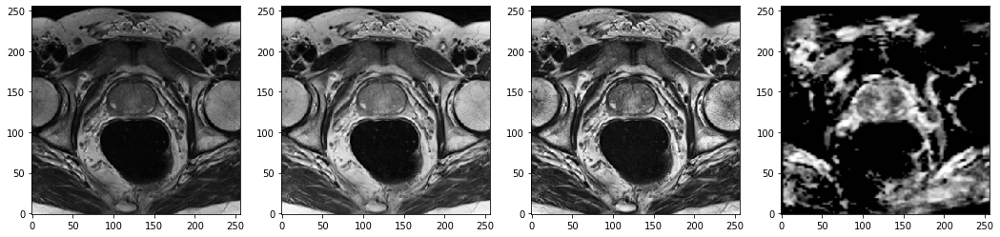

In [ ]:
img = np.load('/content/drive/MyDrive/AI-Medic/Prostate/2D_Seg_Test/Data_Train/img_00_slice_08.npz')['img_0']
img2 = np.load('/content/drive/MyDrive/AI-Medic/Prostate/2D_Seg_Test/Data_Train/img_00_slice_08.npz')['img_1']
plt.figure(figsize=(18,66))
plt.subplot(1,4,1)
plt.imshow(img.T, cmap='gray', origin='lower')
img_bcet = BCET(img,output_mean = 120)
plt.subplot(1,4,2)
plt.imshow(img_bcet.T, cmap='gray', origin='lower')
img_clahe = CLAHE(img, clip_limit = 2.5)
plt.subplot(1,4,3)
plt.imshow(img_clahe.T, cmap='gray', origin='lower')
plt.subplot(1,4,4)
img_clahe_win = window(img, img2, WL=min, WW=max, keep=keep)[:,:,1]
plt.imshow(img_clahe_win.T, cmap='gray', origin='lower')

In [ ]:
best_metrs = []

In [ ]:
# low , high = 0.8 , 1
# val_slices = train_slices[int(low*len(train_slices)):int(high*len(train_slices))]
# train_slices = train_slices[:int(low*len(train_slices))] + train_slices[int(high*len(train_slices)):]
# print(len(train_slices), len(val_slices))


# train_slices, val_slices = train_test_split(train_data, test_size=0.2, random_state=0)


train_slices_all = []
val_slices_all = []
subject_all = []

from sklearn.model_selection import KFold
kf = KFold(5, shuffle=True, random_state=0)
kf.get_n_splits(train_data)
for train_index, val_index in kf.split(train_data):
  train_slices, val_slices = [], []
  for i in train_index:
    train_slices.append(train_data[i])
  for i in val_index:
    val_slices.append(train_data[i])
  train_slices_all.append(train_slices)
  val_slices_all.append(val_slices)
  subject = {}
  for i,path in enumerate(val_slices):
    id = path[-15:-13]
    subject[id] = subject.get(id, []) + [(i,path)] 
  print(subject)
  x = [int(i) for i in list(subject.keys())]
  print(sorted(x))
  print(subject.keys())
  print()
  subject_all.append(subject)


print()
print(subject_all)


{'00': [(0, '/content/drive/MyDrive/AI-Medic/Prostate/2D_Seg_Test/Data_Train/img_00_slice_10.npz')], '01': [(1, '/content/drive/MyDrive/AI-Medic/Prostate/2D_Seg_Test/Data_Train/img_01_slice_00.npz'), (2, '/content/drive/MyDrive/AI-Medic/Prostate/2D_Seg_Test/Data_Train/img_01_slice_02.npz'), (3, '/content/drive/MyDrive/AI-Medic/Prostate/2D_Seg_Test/Data_Train/img_01_slice_06.npz'), (4, '/content/drive/MyDrive/AI-Medic/Prostate/2D_Seg_Test/Data_Train/img_01_slice_16.npz')], '02': [(5, '/content/drive/MyDrive/AI-Medic/Prostate/2D_Seg_Test/Data_Train/img_02_slice_02.npz'), (6, '/content/drive/MyDrive/AI-Medic/Prostate/2D_Seg_Test/Data_Train/img_02_slice_10.npz'), (7, '/content/drive/MyDrive/AI-Medic/Prostate/2D_Seg_Test/Data_Train/img_02_slice_11.npz')], '04': [(8, '/content/drive/MyDrive/AI-Medic/Prostate/2D_Seg_Test/Data_Train/img_04_slice_07.npz'), (9, '/content/drive/MyDrive/AI-Medic/Prostate/2D_Seg_Test/Data_Train/img_04_slice_12.npz')], '06': [(10, '/content/drive/MyDrive/AI-Medic/Pr

In [ ]:
total_dices = []
persub_dices = []

In [ ]:
fold = 5
print(f'Fold number {fold}/5 is being Trained \n'
      f'next fold would be {fold + 1}')
train_slices, val_slices = train_slices_all[fold-1], val_slices_all[fold-1]
subject = subject_all[fold-1]

Fold number 5/5 is being Trained 
next fold would be 6


# Show a sample slice

[0 1 2]
0.0 1448.0
0 255
[0 1]


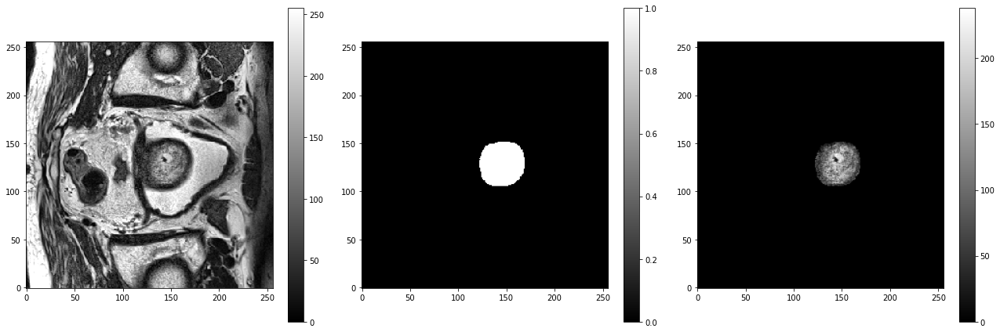

In [ ]:
i = 220

img = np.load(train_slices[i])['img_0']
img1 = np.load(train_slices[i])['img_1']

mask =np.load(train_slices[i])['mask']
print(np.unique(mask))
print(np.min(img), np.max(img))
slice_img = window(img, img1, min, max, keep)
print(np.min(slice_img), np.max(slice_img))
slice_mask = mask_binary(mask, keep=2)
masked = np.array(slice_img)
masked[slice_mask==0]=0
print(np.unique(slice_mask))
plt.figure(figsize=(18,6))
plt.subplot(1,3,1)
plt.imshow(slice_img[:,:,0], cmap='gray', origin='lower')
plt.colorbar()

plt.subplot(1,3,2)
plt.imshow(slice_mask, cmap='gray', origin='lower')
plt.colorbar()

plt.subplot(1,3,3)
plt.imshow(masked[:,:,0], cmap='gray', origin='lower')
plt.colorbar()

plt.tight_layout()
plt.show()

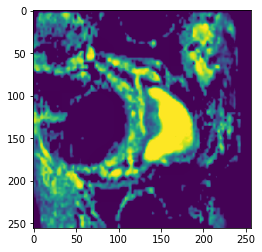

In [ ]:
image_path = train_slices[10]
image = window(np.load(image_path)['img_0'],np.load(image_path)['img_1'], WL=min, WW=max, keep=keep)
plt.imshow(image[:,:,1])

In [ ]:
tst_img = np.load('/content/drive/MyDrive/AI-Medic/Prostate/2D_Seg_Test/Data_Test/img_03_slice_08.npz')

In [ ]:
def get_transforms(phase, size, mean, std):
    list_transforms = []
    if phase == "train":
        list_transforms.extend(
            [
                HorizontalFlip(),
                ShiftScaleRotate(
                    shift_limit=0,  # no resizing
                    scale_limit=0.1,
                    rotate_limit=10, # rotate
                    p=0.5,
                    border_mode=cv2.BORDER_CONSTANT
                ),
#                 GaussNoise(),
            ]
        )
    list_transforms.extend(
        [
            Resize(size, size),
            Normalize(mean=mean, std=std, p=1),
            ToTensor()
        ]
    )
    list_trfms = Compose(list_transforms)
    return list_trfms

class CustomDataSet(Dataset):
    def __init__(self, files_list, size, mean, std, phase):
        self.size = size
        self.mean = mean
        self.std = std
        self.phase = phase
        self.transforms = get_transforms(phase, size, mean, std)
        self.fnames = files_list

    def __getitem__(self, idx):
        image_path = self.fnames[idx]
        image = window(np.load(image_path)['img_0'],np.load(image_path)['img_1'], WL=min, WW=max, keep=keep)
        image = image.astype(float)
        mask = mask_binary(np.load(image_path)['mask'],keep=keep)
        mask = mask.astype(float)

        augmented = self.transforms(image=image, mask=mask)
        image = augmented['image']
        mask = augmented['mask']
        return image, mask

    def __len__(self):
        return len(self.fnames)




phase = 'train'
size=256
mean=(0.485, 0.456)
std=(0.229, 0.224) 
batch_size=16
num_workers=1

train_ds = CustomDataSet(train_slices, size, mean, std, phase)
train_loader = DataLoader(train_ds, batch_size=16, shuffle=True, num_workers=num_workers)

phase='test'
val_ds = CustomDataSet(val_slices, size, mean, std, phase)
val_loader = DataLoader(val_ds, batch_size=16, num_workers=num_workers)


final_val_ds = CustomDataSet(val_slices, size, mean, std, phase)
final_val_loader = DataLoader(val_ds, batch_size=16, num_workers=num_workers)

print(train_loader)
for batch_data in train_loader:
  print(type(batch_data))
  break

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


<class 'list'>


In [ ]:
class TestDataSet(Dataset):
    def __init__(self, files_list, size, mean, std, phase):
        self.size = size
        self.mean = mean
        self.std = std
        self.phase = phase
        self.transforms = get_transforms(phase, size, mean, std)
        self.fnames = files_list

    def __getitem__(self, idx):
        image_path = self.fnames[idx]
        image = window(np.load(image_path)['img_0'],np.load(image_path)['img_1'], WL=min, WW=max, keep=keep)
        image = image.astype(float)

        augmented = self.transforms(image=image)
        image = augmented['image']
        return image

    def __len__(self):
        return len(self.fnames)

test_ds = TestDataSet(test_slices, size, mean, std, phase)
test_loader = DataLoader(test_ds, batch_size=16, num_workers=num_workers)
print(test_loader)
for batch_data in test_loader:
  print(type(batch_data))
  break

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


<class 'torch.Tensor'>


# 1. Get a batch from the dataloader
# 2. Show slices with infection segmentation in a random batch-data

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


[0. 1.]


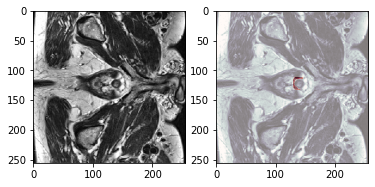

torch.Size([2, 256, 256]) <class 'torch.Tensor'>
[0. 1.]


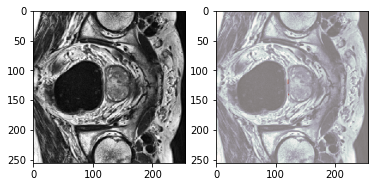

torch.Size([2, 256, 256]) <class 'torch.Tensor'>
[0. 1.]


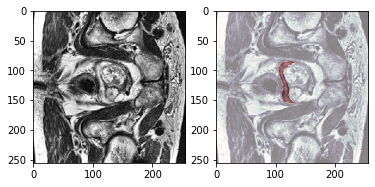

torch.Size([2, 256, 256]) <class 'torch.Tensor'>
[0. 1.]


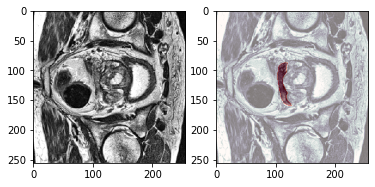

torch.Size([2, 256, 256]) <class 'torch.Tensor'>
[0. 1.]


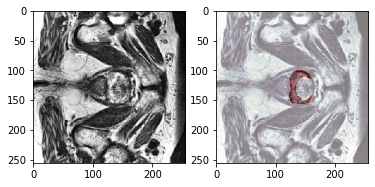

torch.Size([2, 256, 256]) <class 'torch.Tensor'>
[0. 1.]


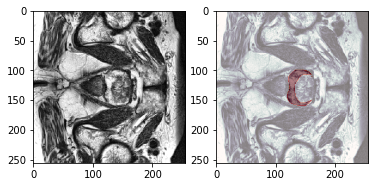

torch.Size([2, 256, 256]) <class 'torch.Tensor'>
[0. 1.]


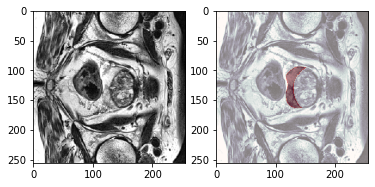

torch.Size([2, 256, 256]) <class 'torch.Tensor'>
[0. 1.]


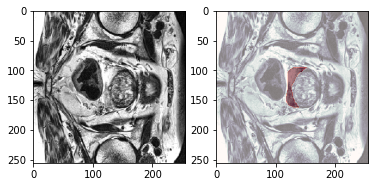

torch.Size([2, 256, 256]) <class 'torch.Tensor'>


In [ ]:
if keep == 1:
  batch = next(iter(val_loader)) 
  images, masks = batch

  for idx in range(8):
    if len(np.unique(masks[idx][0])) > 1:
      print(np.unique(masks[idx][0]))
      plt.subplot(1,2,1)
      plt.imshow(images[idx][0], cmap='gray')
      plt.subplot(1,2,2)
      plt.imshow(images[idx][0], cmap='bone')
      plt.imshow(masks[idx][0], alpha=0.5, cmap='Reds')
      plt.show()
      print(images[idx].shape, type(images[idx]))

In [ ]:

if keep == 2:
  batch = next(iter(train_loader)) 
  images, masks = batch

  for idx in range(8):
    if len(np.unique(masks[idx][0])) > 1:
      print(np.unique(masks[idx][0]))
      plt.subplot(1,2,1)
      plt.imshow(images[idx][0], cmap='gray')
      plt.subplot(1,2,2)
      plt.imshow(images[idx][0], cmap='bone')
      plt.imshow(masks[idx][0], alpha=0.5, cmap='Reds')
      plt.show()

## Create Model
- standard PyTorch program style: create UNet, DiceLoss and Adam optimizer
- use segmentation_models_pytorch 
- import unet with encoder 'resnet18'
- use 'imagenet' encoder weights
- input has 3 channels and output has 1 channel(use sigmoid activation layer for last layer)

In [ ]:
# !git clone https://github.com/NVIDIA/apex
# !cd apex
# !pip install -v --disable-pip-version-check --no-cache-dir --global-option="--cpp_ext" --global-option="--cuda_ext" ./

# !pip install -v --disable-pip-version-check --no-cache-dir ./

In [ ]:
# TORCH_MAJOR = int(torch.__version__.split('.')[0])
# TORCH_MINOR = int(torch.__version__.split('.')[1])

# if TORCH_MAJOR == 1 and TORCH_MINOR < 8:
#     from torch._six import container_abcs
# else:
#     import collections.abc as container_abcs


In [ ]:
try:
  device = torch.device("cuda:0")
  print('run with gpu')
except:
  device = torch.device("cpu")

import segmentation_models_pytorch as smp
n_classes = 1
activation = 'sigmoid' if n_classes == 1 else 'softmax'
model = smp.Unet(
    encoder_name="resnet18",        # choose encoder, e.g. mobilenet_v2 or efficientnet-b7
    # encoder_weights="imagenet",     # use `imagenet` pre-trained weights for encoder initialization
    in_channels=2,                  # model input channels (1 for gray-scale images, 3 for RGB, etc.)
    classes=1,                      # model output channels (number of classes in your dataset)
    activation=activation
).to(device)

# print(model)

run with gpu


Downloading: "https://download.pytorch.org/models/resnet18-5c106cde.pth" to /root/.cache/torch/hub/checkpoints/resnet18-5c106cde.pth


# Loss and Optimizer
- Loss = BCE + Dice_loss
- Optimizer = Adam with initial_lr = 1e-3
- lr_scheduler with CosineAnnealingLR for lr decay

In [ ]:
bce_loss = torch.nn.BCELoss()

def dice_loss(pred,target):
    numerator = 2 * torch.sum(pred * target)
    denominator = torch.sum(pred + target)
    return  1 - (numerator + 1) / (denominator + 1)

def bce_dice_loss(pred,target):
  return bce_loss(pred,target) + dice_loss(pred,target)

loss_function = bce_dice_loss

optimizer = torch.optim.Adam(model.parameters(), 1e-3,weight_decay=0)
epoch_num = 100
val_interval = 1
steps = epoch_num#int(len(train_slices)/batch_size)+1
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, steps)

# Define custom metric

In [ ]:
from torch.autograd import Variable

def my_dice(y_pred,y_true,device='cpu',thr=0.5):
    thr = Variable(torch.Tensor([thr])).to(device)  
    y_pred = (y_pred > thr).float() * 1
    smooth = 1e-4
    iflat = y_pred.view(-1)
    tflat = y_true.view(-1)
    intersection = (iflat * tflat).sum()
    return ((2.0 * intersection + smooth) / (iflat.sum() + tflat.sum() + smooth))

# Execute a typical PyTorch training process

In [ ]:
best_metric = -1
best_metric_epoch = -1
epoch_loss_values = list()
metric_values = list()
for epoch in range(epoch_num):
    print('-' * 10)
    print(f"epoch {epoch + 1}/{epoch_num}")
    model.train()
    epoch_loss = 0
    step = 0
    for batch_data in train_loader:

        step += 1
        inputs, labels = batch_data[0].to(device), batch_data[1].to(device)
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = loss_function(outputs, labels)
        loss.backward()
        optimizer.step()
        epoch_loss += loss.item()
        epoch_len = 1+(len(train_ds) // train_loader.batch_size)

        sys.stdout.write('\r'+f"{step}/{epoch_len}, train_loss: {loss.item():.4f}")

    epoch_loss /= step
    epoch_loss_values.append(epoch_loss)

    print('\n',f"###### epoch {epoch + 1} average loss: {epoch_loss:.4f}")

    if (epoch + 1) % val_interval == 0:

        # Normal Eval

        model.eval()
        with torch.no_grad():
            y_pred = torch.tensor([], dtype=torch.float32, device=device)
            y = torch.tensor([], dtype=torch.long, device=device)
            for val_data in val_loader:
                val_images, val_labels = val_data[0].to(device), val_data[1].to(device)
                y_pred = torch.cat([y_pred, model(val_images)], dim=0)
                y = torch.cat([y, val_labels], dim=0)
            dice_metric = my_dice(y_pred, y,device=device,thr=0.5)
            metric_values.append(dice_metric)

            if dice_metric > best_metric:
                best_metric = dice_metric
                best_metric_epoch = epoch + 1
                torch.save(model.state_dict(), root_dir + "best_metric_model_2D_"+str(keep)+"_fold_"+str(fold)+".pth")
                print('###### Congratulations ###### saved new best metric model')
            print(f"current epoch: {epoch + 1} current DICE: {dice_metric:.4f}\n"
                  f"best metric: {best_metric:.4f} at epoch: {best_metric_epoch}")
        scheduler.step()
        print('The learning rate updated to :',scheduler.get_lr()[0])


print(f"train completed, best_metric: {best_metric:.4f} at epoch: {best_metric_epoch}")

----------
epoch 1/100


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.8075
 ###### epoch 1 average loss: 1.1031


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


###### Congratulations ###### saved new best metric model
current epoch: 1 current DICE: 0.6140
best metric: 0.6140 at epoch: 1
The learning rate updated to : 0.0009995066212363998
----------
epoch 2/100


/usr/local/lib/python3.7/dist-packages/torch/optim/lr_scheduler.py:509: UserWarning: To get the last learning rate computed by the scheduler, please use `get_last_lr()`.
  "please use `get_last_lr()`.", UserWarning)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.5314
 ###### epoch 2 average loss: 0.6156


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


###### Congratulations ###### saved new best metric model
current epoch: 2 current DICE: 0.8313
best metric: 0.8313 at epoch: 2
The learning rate updated to : 0.000998273995856153
----------
epoch 3/100


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.5465
 ###### epoch 3 average loss: 0.3555


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


current epoch: 3 current DICE: 0.1075
best metric: 0.8313 at epoch: 2
The learning rate updated to : 0.0009965501206540706
----------
epoch 4/100


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.3146
 ###### epoch 4 average loss: 0.2824


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


###### Congratulations ###### saved new best metric model
current epoch: 4 current DICE: 0.8514
best metric: 0.8514 at epoch: 4
The learning rate updated to : 0.0009943366965261377
----------
epoch 5/100


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.5227
 ###### epoch 5 average loss: 0.2331


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


current epoch: 5 current DICE: 0.8441
best metric: 0.8514 at epoch: 4
The learning rate updated to : 0.0009916359074934001
----------
epoch 6/100


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.1732
 ###### epoch 6 average loss: 0.2178


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


current epoch: 6 current DICE: 0.8480
best metric: 0.8514 at epoch: 4
The learning rate updated to : 0.0009884504185462433
----------
epoch 7/100


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.2464
 ###### epoch 7 average loss: 0.1797


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


current epoch: 7 current DICE: 0.8458
best metric: 0.8514 at epoch: 4
The learning rate updated to : 0.0009847833730140026
----------
epoch 8/100


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.2153
 ###### epoch 8 average loss: 0.1657


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


###### Congratulations ###### saved new best metric model
current epoch: 8 current DICE: 0.8669
best metric: 0.8669 at epoch: 8
The learning rate updated to : 0.0009806383894625128
----------
epoch 9/100


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.2323
 ###### epoch 9 average loss: 0.1579


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


###### Congratulations ###### saved new best metric model
current epoch: 9 current DICE: 0.8757
best metric: 0.8757 at epoch: 9
The learning rate updated to : 0.0009760195581226453
----------
epoch 10/100


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.1916
 ###### epoch 10 average loss: 0.1481


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


current epoch: 10 current DICE: 0.8608
best metric: 0.8757 at epoch: 9
The learning rate updated to : 0.0009709314368533636
----------
epoch 11/100


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.8227
 ###### epoch 11 average loss: 0.1665


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


current epoch: 11 current DICE: 0.8714
best metric: 0.8757 at epoch: 9
The learning rate updated to : 0.0009653790466432791
----------
epoch 12/100
1/29, train_loss: 0.1143

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.1894
 ###### epoch 12 average loss: 0.1814


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


current epoch: 12 current DICE: 0.8401
best metric: 0.8757 at epoch: 9
The learning rate updated to : 0.0009593678666551406
----------
epoch 13/100


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.5808
 ###### epoch 13 average loss: 0.1731


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


current epoch: 13 current DICE: 0.8494
best metric: 0.8757 at epoch: 9
The learning rate updated to : 0.0009529038288181519
----------
epoch 14/100


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.1750
 ###### epoch 14 average loss: 0.2129


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


current epoch: 14 current DICE: 0.6654
best metric: 0.8757 at epoch: 9
The learning rate updated to : 0.0009459933119734495
----------
epoch 15/100
1/29, train_loss: 0.1441

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.5826
 ###### epoch 15 average loss: 0.1648


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


###### Congratulations ###### saved new best metric model
current epoch: 15 current DICE: 0.8799
best metric: 0.8799 at epoch: 15
The learning rate updated to : 0.0009386431355785155
----------
epoch 16/100


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.2191
 ###### epoch 16 average loss: 0.1515


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


###### Congratulations ###### saved new best metric model
current epoch: 16 current DICE: 0.8891
best metric: 0.8891 at epoch: 16
The learning rate updated to : 0.0009308605529767429
----------
epoch 17/100
1/29, train_loss: 0.1007

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.2342
 ###### epoch 17 average loss: 0.1382


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


current epoch: 17 current DICE: 0.8873
best metric: 0.8891 at epoch: 16
The learning rate updated to : 0.000922653244238784
----------
epoch 18/100


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.1964
 ###### epoch 18 average loss: 0.1348


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


current epoch: 18 current DICE: 0.8635
best metric: 0.8891 at epoch: 16
The learning rate updated to : 0.0009140293085827522
----------
epoch 19/100


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.0478
 ###### epoch 19 average loss: 0.1240


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


current epoch: 19 current DICE: 0.8737
best metric: 0.8891 at epoch: 16
The learning rate updated to : 0.000904997256380754
----------
epoch 20/100


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.1145
 ###### epoch 20 average loss: 0.1180


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


current epoch: 20 current DICE: 0.8838
best metric: 0.8891 at epoch: 16
The learning rate updated to : 0.0008955660007596339
----------
epoch 21/100


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.1022
 ###### epoch 21 average loss: 0.1142


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


current epoch: 21 current DICE: 0.8872
best metric: 0.8891 at epoch: 16
The learning rate updated to : 0.0008857448488042209
----------
epoch 22/100
2/29, train_loss: 0.0795

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.8731
 ###### epoch 22 average loss: 0.1348


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


current epoch: 22 current DICE: 0.8719
best metric: 0.8891 at epoch: 16
The learning rate updated to : 0.0008755434923717585
----------
epoch 23/100


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.0947
 ###### epoch 23 average loss: 0.1158


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


current epoch: 23 current DICE: 0.8815
best metric: 0.8891 at epoch: 16
The learning rate updated to : 0.0008649719985265717
----------
epoch 24/100


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.1010
 ###### epoch 24 average loss: 0.1034


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


current epoch: 24 current DICE: 0.8828
best metric: 0.8891 at epoch: 16
The learning rate updated to : 0.0008540407996044174
----------
epoch 25/100


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.0633
 ###### epoch 25 average loss: 0.1050


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


###### Congratulations ###### saved new best metric model
current epoch: 25 current DICE: 0.8965
best metric: 0.8965 at epoch: 25
The learning rate updated to : 0.000842760682916312
----------
epoch 26/100


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.2200
 ###### epoch 26 average loss: 0.1075


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


current epoch: 26 current DICE: 0.8931
best metric: 0.8965 at epoch: 25
The learning rate updated to : 0.0008311427801019982
----------
epoch 27/100


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.2511
 ###### epoch 27 average loss: 0.1266


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


current epoch: 27 current DICE: 0.8263
best metric: 0.8965 at epoch: 25
The learning rate updated to : 0.000819198556143549
----------
epoch 28/100


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.1206
 ###### epoch 28 average loss: 0.1168


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


current epoch: 28 current DICE: 0.8663
best metric: 0.8965 at epoch: 25
The learning rate updated to : 0.0008069397980499532
----------
epoch 29/100


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.1377
 ###### epoch 29 average loss: 0.1123


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


current epoch: 29 current DICE: 0.8939
best metric: 0.8965 at epoch: 25
The learning rate updated to : 0.0007943786032238348
----------
epoch 30/100


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.1138
 ###### epoch 30 average loss: 0.1063


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


current epoch: 30 current DICE: 0.8733
best metric: 0.8965 at epoch: 25
The learning rate updated to : 0.0007815273675217895
----------
epoch 31/100


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.1514
 ###### epoch 31 average loss: 0.1127


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


current epoch: 31 current DICE: 0.8754
best metric: 0.8965 at epoch: 25
The learning rate updated to : 0.0007683987730201094
----------
epoch 32/100


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.2399
 ###### epoch 32 average loss: 0.1097


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


current epoch: 32 current DICE: 0.8923
best metric: 0.8965 at epoch: 25
The learning rate updated to : 0.0007550057754979648
----------
epoch 33/100
1/29, train_loss: 0.0918

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.1421
 ###### epoch 33 average loss: 0.0918


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


current epoch: 33 current DICE: 0.8868
best metric: 0.8965 at epoch: 25
The learning rate updated to : 0.0007413615916503877
----------
epoch 34/100


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.0566
 ###### epoch 34 average loss: 0.0889


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


current epoch: 34 current DICE: 0.8893
best metric: 0.8965 at epoch: 25
The learning rate updated to : 0.0007274796860436639
----------
epoch 35/100


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.0948
 ###### epoch 35 average loss: 0.0822


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


current epoch: 35 current DICE: 0.8866
best metric: 0.8965 at epoch: 25
The learning rate updated to : 0.0007133737578260039
----------
epoch 36/100


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.0650
 ###### epoch 36 average loss: 0.0867


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


current epoch: 36 current DICE: 0.8944
best metric: 0.8965 at epoch: 25
The learning rate updated to : 0.0006990577272065891
----------
epoch 37/100


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.0528
 ###### epoch 37 average loss: 0.0903


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


###### Congratulations ###### saved new best metric model
current epoch: 37 current DICE: 0.8998
best metric: 0.8998 at epoch: 37
The learning rate updated to : 0.0006845457217163287
----------
epoch 38/100


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.1072
 ###### epoch 38 average loss: 0.0865


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


current epoch: 38 current DICE: 0.8869
best metric: 0.8998 at epoch: 37
The learning rate updated to : 0.0006698520622638713
----------
epoch 39/100


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.0548
 ###### epoch 39 average loss: 0.0771


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


current epoch: 39 current DICE: 0.8906
best metric: 0.8998 at epoch: 37
The learning rate updated to : 0.0006549912490006145
----------
epoch 40/100


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.1680
 ###### epoch 40 average loss: 0.0807


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


current epoch: 40 current DICE: 0.8967
best metric: 0.8998 at epoch: 37
The learning rate updated to : 0.0006399779470086494
----------
epoch 41/100


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.1560
 ###### epoch 41 average loss: 0.0781


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


current epoch: 41 current DICE: 0.8961
best metric: 0.8998 at epoch: 37
The learning rate updated to : 0.0006248269718257366
----------
epoch 42/100


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.1299
 ###### epoch 42 average loss: 0.0848


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


current epoch: 42 current DICE: 0.8961
best metric: 0.8998 at epoch: 37
The learning rate updated to : 0.0006095532748215814
----------
epoch 43/100


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.0755
 ###### epoch 43 average loss: 0.0820


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


current epoch: 43 current DICE: 0.8894
best metric: 0.8998 at epoch: 37
The learning rate updated to : 0.000594171928439816
----------
epoch 44/100
1/29, train_loss: 0.0719

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.0589
 ###### epoch 44 average loss: 0.0761


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


current epoch: 44 current DICE: 0.8922
best metric: 0.8998 at epoch: 37
The learning rate updated to : 0.0005786981113202135
----------
epoch 45/100


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.0664
 ###### epoch 45 average loss: 0.0752


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


current epoch: 45 current DICE: 0.8916
best metric: 0.8998 at epoch: 37
The learning rate updated to : 0.0005631470933157985
----------
epoch 46/100


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.1084
 ###### epoch 46 average loss: 0.0719


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


current epoch: 46 current DICE: 0.8903
best metric: 0.8998 at epoch: 37
The learning rate updated to : 0.0005475342204195886
----------
epoch 47/100


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.1107
 ###### epoch 47 average loss: 0.0703


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


current epoch: 47 current DICE: 0.8990
best metric: 0.8998 at epoch: 37
The learning rate updated to : 0.0005318748996158037
----------
epoch 48/100
1/29, train_loss: 0.0689

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.0663
 ###### epoch 48 average loss: 0.0665


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


current epoch: 48 current DICE: 0.8909
best metric: 0.8998 at epoch: 37
The learning rate updated to : 0.0005161845836704487
----------
epoch 49/100


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.8541
 ###### epoch 49 average loss: 0.0973


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


###### Congratulations ###### saved new best metric model
current epoch: 49 current DICE: 0.9002
best metric: 0.9002 at epoch: 49
The learning rate updated to : 0.000500478755876209
----------
epoch 50/100


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 1.2540
 ###### epoch 50 average loss: 0.1232


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


current epoch: 50 current DICE: 0.8999
best metric: 0.9002 at epoch: 49
The learning rate updated to : 0.00048477291476666255
----------
epoch 51/100


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.1834
 ###### epoch 51 average loss: 0.1047


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


current epoch: 51 current DICE: 0.8964
best metric: 0.9002 at epoch: 49
The learning rate updated to : 0.000469082558814804
----------
epoch 52/100


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.0611
 ###### epoch 52 average loss: 0.0977


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


###### Congratulations ###### saved new best metric model
current epoch: 52 current DICE: 0.9013
best metric: 0.9013 at epoch: 52
The learning rate updated to : 0.000453423171130901
----------
epoch 53/100
1/29, train_loss: 0.0938

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.0719
 ###### epoch 53 average loss: 0.0784


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


current epoch: 53 current DICE: 0.8837
best metric: 0.9013 at epoch: 52
The learning rate updated to : 0.0004378102041746763
----------
epoch 54/100


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.0547
 ###### epoch 54 average loss: 0.0695


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


current epoch: 54 current DICE: 0.9007
best metric: 0.9013 at epoch: 52
The learning rate updated to : 0.0004222590644967843
----------
epoch 55/100


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.0441
 ###### epoch 55 average loss: 0.0887


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


current epoch: 55 current DICE: 0.8987
best metric: 0.9013 at epoch: 52
The learning rate updated to : 0.00040678509752449684
----------
epoch 56/100


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.1523
 ###### epoch 56 average loss: 0.0712


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


current epoch: 56 current DICE: 0.8976
best metric: 0.9013 at epoch: 52
The learning rate updated to : 0.0003914035724064511
----------
epoch 57/100


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.0469
 ###### epoch 57 average loss: 0.0695


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


###### Congratulations ###### saved new best metric model
current epoch: 57 current DICE: 0.9037
best metric: 0.9037 at epoch: 57
The learning rate updated to : 0.00037612966693121463
----------
epoch 58/100


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.0334
 ###### epoch 58 average loss: 0.0633


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


current epoch: 58 current DICE: 0.9001
best metric: 0.9037 at epoch: 57
The learning rate updated to : 0.0003609784525343248
----------
epoch 59/100


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.0706
 ###### epoch 59 average loss: 0.0624


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


current epoch: 59 current DICE: 0.8951
best metric: 0.9037 at epoch: 57
The learning rate updated to : 0.00034596487940832647
----------
epoch 60/100


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.1231
 ###### epoch 60 average loss: 0.0651


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


current epoch: 60 current DICE: 0.9034
best metric: 0.9037 at epoch: 57
The learning rate updated to : 0.0003311037617301638
----------
epoch 61/100


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.0677
 ###### epoch 61 average loss: 0.0604


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


current epoch: 61 current DICE: 0.8971
best metric: 0.9037 at epoch: 57
The learning rate updated to : 0.0003164097630201318
----------
epoch 62/100
1/29, train_loss: 0.0605

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.0672
 ###### epoch 62 average loss: 0.0601


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


current epoch: 62 current DICE: 0.8974
best metric: 0.9037 at epoch: 57
The learning rate updated to : 0.0003018973816463545
----------
epoch 63/100


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.0411
 ###### epoch 63 average loss: 0.0566


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


current epoch: 63 current DICE: 0.8937
best metric: 0.9037 at epoch: 57
The learning rate updated to : 0.0002875809364885268
----------
epoch 64/100


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.0557
 ###### epoch 64 average loss: 0.0552


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


current epoch: 64 current DICE: 0.8987
best metric: 0.9037 at epoch: 57
The learning rate updated to : 0.0002734745527743966
----------
epoch 65/100


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.0475
 ###### epoch 65 average loss: 0.0611


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


current epoch: 65 current DICE: 0.9009
best metric: 0.9037 at epoch: 57
The learning rate updated to : 0.0002595921481021044
----------
epoch 66/100


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.0657
 ###### epoch 66 average loss: 0.0547


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


current epoch: 66 current DICE: 0.8955
best metric: 0.9037 at epoch: 57
The learning rate updated to : 0.00024594741866117294
----------
epoch 67/100


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.0524
 ###### epoch 67 average loss: 0.0568


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


current epoch: 67 current DICE: 0.8958
best metric: 0.9037 at epoch: 57
The learning rate updated to : 0.00023255382566446638
----------
epoch 68/100


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.0461
 ###### epoch 68 average loss: 0.0539


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


current epoch: 68 current DICE: 0.9028
best metric: 0.9037 at epoch: 57
The learning rate updated to : 0.00021942458200295052
----------
epoch 69/100


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.0402
 ###### epoch 69 average loss: 0.0522


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


current epoch: 69 current DICE: 0.8980
best metric: 0.9037 at epoch: 57
The learning rate updated to : 0.00020657263913448264
----------
epoch 70/100


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.1046
 ###### epoch 70 average loss: 0.0525


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


current epoch: 70 current DICE: 0.9029
best metric: 0.9037 at epoch: 57
The learning rate updated to : 0.00019401067421711586
----------
epoch 71/100


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.0677
 ###### epoch 71 average loss: 0.0527


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


current epoch: 71 current DICE: 0.9010
best metric: 0.9037 at epoch: 57
The learning rate updated to : 0.00018175107749654576
----------
epoch 72/100


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.0395
 ###### epoch 72 average loss: 0.0511


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


current epoch: 72 current DICE: 0.9012
best metric: 0.9037 at epoch: 57
The learning rate updated to : 0.00016980593995622053
----------
epoch 73/100


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.0468
 ###### epoch 73 average loss: 0.0503


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


current epoch: 73 current DICE: 0.9015
best metric: 0.9037 at epoch: 57
The learning rate updated to : 0.0001581870412372791
----------
epoch 74/100
1/29, train_loss: 0.0467

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.0608
 ###### epoch 74 average loss: 0.0469


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


current epoch: 74 current DICE: 0.9010
best metric: 0.9037 at epoch: 57
The learning rate updated to : 0.00014690583783376208
----------
epoch 75/100


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.0237
 ###### epoch 75 average loss: 0.0487


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


current epoch: 75 current DICE: 0.9018
best metric: 0.9037 at epoch: 57
The learning rate updated to : 0.00013597345156629337
----------
epoch 76/100


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.0581
 ###### epoch 76 average loss: 0.0483


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


###### Congratulations ###### saved new best metric model
current epoch: 76 current DICE: 0.9037
best metric: 0.9037 at epoch: 76
The learning rate updated to : 0.0001254006583344972
----------
epoch 77/100


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.0507
 ###### epoch 77 average loss: 0.0490


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


current epoch: 77 current DICE: 0.9022
best metric: 0.9037 at epoch: 76
The learning rate updated to : 0.00011519787714451127
----------
epoch 78/100


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.1450
 ###### epoch 78 average loss: 0.0509


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


current epoch: 78 current DICE: 0.9015
best metric: 0.9037 at epoch: 76
The learning rate updated to : 0.00010537515940262572
----------
epoch 79/100


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.0414
 ###### epoch 79 average loss: 0.0466


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


current epoch: 79 current DICE: 0.9030
best metric: 0.9037 at epoch: 76
The learning rate updated to : 9.59421784587424e-05
----------
epoch 80/100


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.0374
 ###### epoch 80 average loss: 0.0477


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


current epoch: 80 current DICE: 0.9000
best metric: 0.9037 at epoch: 76
The learning rate updated to : 8.690821937305474e-05
----------
epoch 81/100


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.0394
 ###### epoch 81 average loss: 0.0475


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


current epoch: 81 current DICE: 0.8990
best metric: 0.9037 at epoch: 76
The learning rate updated to : 7.828216886459197e-05
----------
epoch 82/100


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.0507
 ###### epoch 82 average loss: 0.0455


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


current epoch: 82 current DICE: 0.9021
best metric: 0.9037 at epoch: 76
The learning rate updated to : 7.007250537884824e-05
----------
epoch 83/100


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.0762
 ###### epoch 83 average loss: 0.0478


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


###### Congratulations ###### saved new best metric model
current epoch: 83 current DICE: 0.9040
best metric: 0.9040 at epoch: 83
The learning rate updated to : 6.228728917986295e-05
----------
epoch 84/100


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.0457
 ###### epoch 84 average loss: 0.0478


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


###### Congratulations ###### saved new best metric model
current epoch: 84 current DICE: 0.9047
best metric: 0.9047 at epoch: 84
The learning rate updated to : 5.4934152323919137e-05
----------
epoch 85/100


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.0372
 ###### epoch 85 average loss: 0.0437


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


current epoch: 85 current DICE: 0.9021
best metric: 0.9047 at epoch: 84
The learning rate updated to : 4.8020288297353266e-05
----------
epoch 86/100


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.1265
 ###### epoch 86 average loss: 0.0466


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


current epoch: 86 current DICE: 0.9018
best metric: 0.9047 at epoch: 84
The learning rate updated to : 4.155244098261495e-05
----------
epoch 87/100


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.0394
 ###### epoch 87 average loss: 0.0461


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


current epoch: 87 current DICE: 0.9001
best metric: 0.9047 at epoch: 84
The learning rate updated to : 3.553689242401031e-05
----------
epoch 88/100


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.0390
 ###### epoch 88 average loss: 0.0434


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


current epoch: 88 current DICE: 0.9023
best metric: 0.9047 at epoch: 84
The learning rate updated to : 2.9979448541718638e-05
----------
epoch 89/100


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.0517
 ###### epoch 89 average loss: 0.0438


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


current epoch: 89 current DICE: 0.9022
best metric: 0.9047 at epoch: 84
The learning rate updated to : 2.4885421383796386e-05
----------
epoch 90/100


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.0588
 ###### epoch 90 average loss: 0.0437


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


current epoch: 90 current DICE: 0.9010
best metric: 0.9047 at epoch: 84
The learning rate updated to : 2.0259605502241937e-05
----------
epoch 91/100
2/29, train_loss: 0.0495

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.0426
 ###### epoch 91 average loss: 0.0426


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


current epoch: 91 current DICE: 0.9004
best metric: 0.9047 at epoch: 84
The learning rate updated to : 1.61062441593761e-05
----------
epoch 92/100


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.4435
 ###### epoch 92 average loss: 0.0573


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


current epoch: 92 current DICE: 0.9037
best metric: 0.9047 at epoch: 84
The learning rate updated to : 1.2428977374215939e-05
----------
epoch 93/100
2/29, train_loss: 0.0393

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.0396
 ###### epoch 93 average loss: 0.0444


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


current epoch: 93 current DICE: 0.9028
best metric: 0.9047 at epoch: 84
The learning rate updated to : 9.230756122372652e-06
----------
epoch 94/100


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.1061
 ###### epoch 94 average loss: 0.0445


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


current epoch: 94 current DICE: 0.9024
best metric: 0.9047 at epoch: 84
The learning rate updated to : 6.5136898524686845e-06
----------
epoch 95/100


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.0274
 ###### epoch 95 average loss: 0.0432


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


current epoch: 95 current DICE: 0.9006
best metric: 0.9047 at epoch: 84
The learning rate updated to : 4.278752975599311e-06
----------
epoch 96/100


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.0896
 ###### epoch 96 average loss: 0.0447


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


current epoch: 96 current DICE: 0.9023
best metric: 0.9047 at epoch: 84
The learning rate updated to : 2.525164696131144e-06
----------
epoch 97/100


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.0401
 ###### epoch 97 average loss: 0.0443


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


current epoch: 97 current DICE: 0.9009
best metric: 0.9047 at epoch: 84
The learning rate updated to : 1.2489164310591009e-06
----------
epoch 98/100


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.0455
 ###### epoch 98 average loss: 0.0423


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


current epoch: 98 current DICE: 0.9007
best metric: 0.9047 at epoch: 84
The learning rate updated to : 4.3868517796116835e-07
----------
epoch 99/100


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.1421
 ###### epoch 99 average loss: 0.0454


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


current epoch: 99 current DICE: 0.9032
best metric: 0.9047 at epoch: 84
The learning rate updated to : 6.169517570601277e-08
----------
epoch 100/100


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


29/29, train_loss: 0.0208
 ###### epoch 100 average loss: 0.0430


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


current epoch: 100 current DICE: 0.9011
best metric: 0.9047 at epoch: 84
The learning rate updated to : 0.0
train completed, best_metric: 0.9047 at epoch: 84


## Plot the loss and metric

In [ ]:
if keep == 1:
  plt.figure('train', (15, 6))
  plt.subplot(1, 2, 1)
  plt.title("Epoch Average Loss")
  x = [i + 1 for i in range(len(epoch_loss_values))]
  y = epoch_loss_values
  plt.xlabel('epoch')
  plt.plot(x, y)
  plt.subplot(1, 2, 2)
  plt.title("Validation: DICE")
  x = [val_interval * (i + 1) for i in range(len(metric_values))]
  y = metric_values
  plt.xlabel('epoch')
  plt.plot(x, y)
  plt.show()

  print(f'Fold number {fold} is being Trained \n'
      f'next fold would be {fold + 1}')
  

  metrs = []
  for i in range(len(y)):
    met = float(y[i].cpu().detach().numpy())
    metrs.append(met)
  best_metrs.append(sorted(metrs)[-1])

  print(best_metrs)


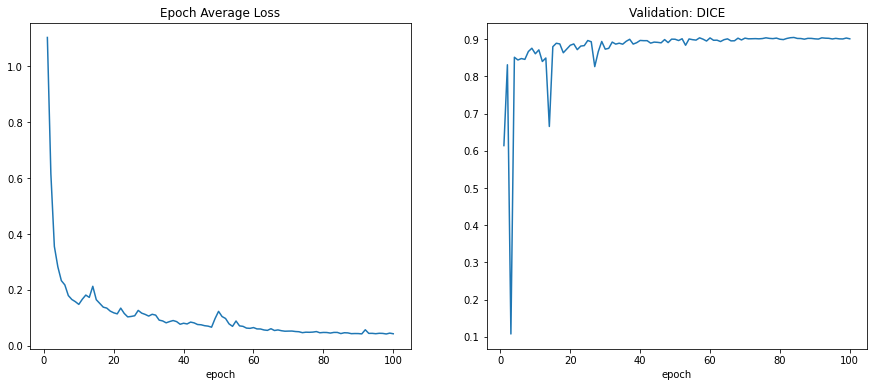

Fold number 5 is being Trained 
next fold would be 6
[0.9074685573577881, 0.9184258580207825, 0.9032265543937683, 0.910398006439209, 0.9046855568885803]


In [ ]:
if keep == 2:
  plt.figure('train', (15, 6))
  plt.subplot(1, 2, 1)
  plt.title("Epoch Average Loss")
  x = [i + 1 for i in range(len(epoch_loss_values))]
  y = epoch_loss_values
  plt.xlabel('epoch')
  plt.plot(x, y)
  plt.subplot(1, 2, 2)
  plt.title("Validation: DICE")
  x = [val_interval * (i + 1) for i in range(len(metric_values))]
  y = metric_values
  plt.xlabel('epoch')
  plt.plot(x, y)
  plt.show()
  
  print(f'Fold number {fold} is being Trained \n'
      f'next fold would be {fold + 1}')
  

  metrs = []
  for i in range(len(y)):
    met = float(y[i].cpu().detach().numpy())
    metrs.append(met)
  best_metrs.append(sorted(metrs)[-1])

  print(best_metrs)


## Check best model output with the input slice and label

In [ ]:
all_dices = np.array([0,0,0,0,0])

In [ ]:
keep = 1
fold = 1
train_slices, val_slices = train_slices_all[fold-1], val_slices_all[fold-1]
subject = subject_all[fold-1]

In [ ]:
model.load_state_dict(torch.load(root_dir +"best_metric_model_2D_"+str(keep)+"_fold_"+str(fold)+".pth"))
model.eval()
y_true = list()
y_pred = list()
# y_new_pred = list()
print(val_loader.__len__())
with torch.no_grad():
    for val_data in val_loader:
        test_images, test_labels = val_data[0].to(device), val_data[1].to(device)
        pred = model(test_images)
        # new_pred = pred.argmax(dim=1)

        for i in range(len(pred)):
            y_true.append(test_labels[i].cpu().detach().numpy())
            y_pred.append(pred[i].cpu().detach().numpy())
            # y_new_pred.append(new_pred[i].cpu().detach().numpy())

8


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


torch.Size([16, 2, 256, 256])
torch.Size([16, 2, 256, 256])
torch.Size([16, 2, 256, 256])
torch.Size([16, 2, 256, 256])
torch.Size([16, 2, 256, 256])
torch.Size([16, 2, 256, 256])
torch.Size([16, 2, 256, 256])
torch.Size([1, 2, 256, 256])


In [ ]:
y_true = np.array(y_true)
y_pred = np.array(y_pred)
y_true.shape,y_pred.shape

((112, 1, 256, 256), (112, 1, 256, 256))

In [ ]:
def dice(true,pred):
  smooth = 0.0001
  t = true.flatten()
  p = pred.flatten()
  d = (2 * (t*p).sum() + smooth)/(t.sum() + p.sum() + smooth)
  return d


In [ ]:
import random

if keep == 1:
  n_sample = 20

  samples = random.sample(range(len(val_slices)),n_sample)

  images, masks, predict = [],[],[]
  for sample in samples:
    images.append(cv2.resize(np.load(np.array(val_slices)[sample])['img_0'],(size,size)))
    masks.append(y_true[sample,0])
    predict.append(y_pred[sample,0]>0.5)

  

  print('          Raw Images        ,       True Mask(green)      ,   Prediction Mask(Red)')
  for idx in range(n_sample):
    if np.sum(masks[idx])+np.sum(predict[idx]) > 10:
      plt.figure(figsize=(12,36))
      plt.subplot(1,3,1)
      plt.imshow(images[idx], cmap='gray')
      plt.subplot(1,3,2)
      plt.imshow(images[idx], cmap='gray')
      plt.imshow(masks[idx], alpha=0.5, cmap='Greens')
      plt.subplot(1,3,3)
      plt.imshow(images[idx], cmap='gray')
      plt.imshow(predict[idx], alpha=0.5, cmap='Reds')
      plt.show()

Keep label 2
          Raw Images        ,       True Mask(green)      ,   Prediction Mask(Red)


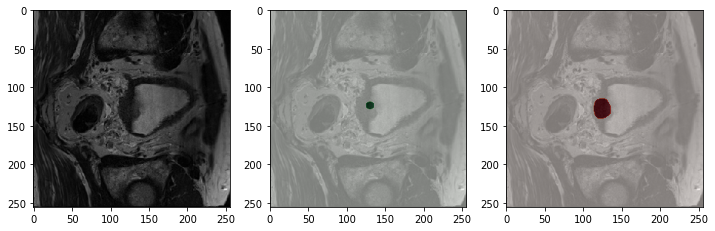

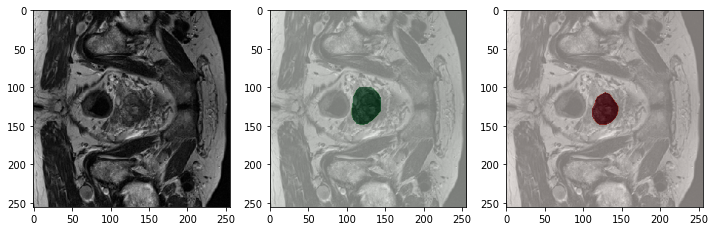

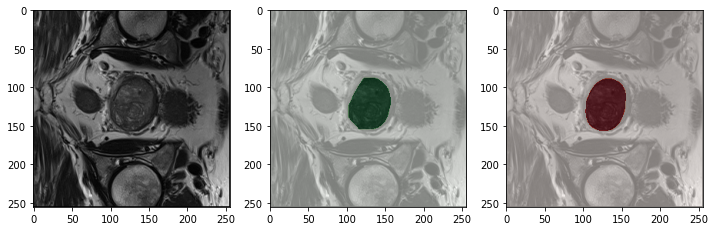

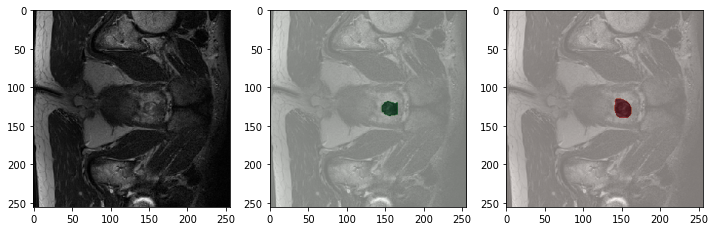

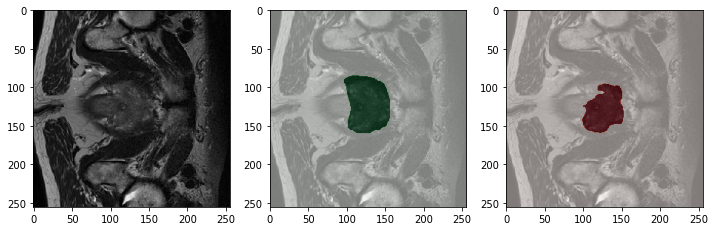

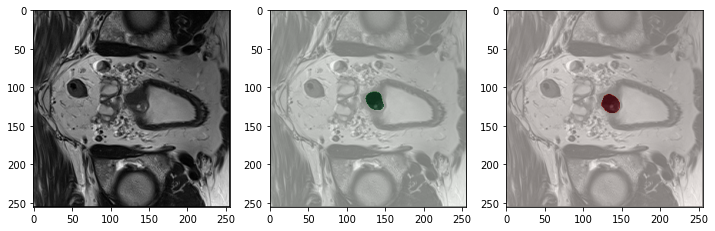

In [ ]:
if keep == 2:
  print('Keep label 2')

  n_sample = 8

  samples = np.random.randint(0,80,n_sample)

  images, masks, predict = [],[],[]
  for sample in samples:
    images.append(cv2.resize(np.load(np.array(val_slices)[sample])['img_0'],(size,size)))
    masks.append(y_true[sample,0])
    predict.append(y_pred[sample,0]>0.5)

  print('          Raw Images        ,       True Mask(green)      ,   Prediction Mask(Red)')
  for idx in range(n_sample):
    if np.sum(masks[idx])+np.sum(predict[idx]) > 10:
      plt.figure(figsize=(12,36))
      plt.subplot(1,3,1)
      plt.imshow(images[idx], cmap='gray')
      plt.subplot(1,3,2)
      plt.imshow(images[idx], cmap='gray')
      plt.imshow(masks[idx], alpha=0.5, cmap='Greens')
      plt.subplot(1,3,3)
      plt.imshow(images[idx], cmap='gray')
      plt.imshow(predict[idx], alpha=0.5, cmap='Reds')
      plt.show()

Bad Subjects:


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide




Per Subject Dice: 0.8682442192202519 
Best Overal Dice: 0.9046855568885803 
Per Subject Dice Without Bad Subjects: 0.868244219220252


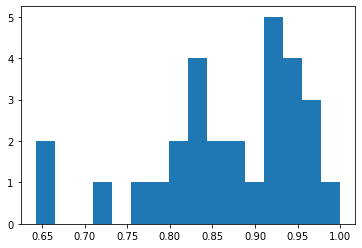

In [ ]:
print('Bad Subjects:')
model.eval()
bad_subs = []
with torch.no_grad():
    dices = np.array([])
    dices_good = np.array([])
    dice_metric = 0
    for sub, data in subject.items():
      y_pred = torch.tensor([], dtype=torch.float32, device=device)
      y = torch.tensor([], dtype=torch.long, device=device)
      for id, path in  data:
        val_img, val_mask = val_ds.__getitem__(id)
        val_img, val_mask = val_img.cuda(), val_mask.cuda()
        y_pred = torch.cat((y_pred, model(val_img[None,...])), 0)
        y = torch.cat((y, val_mask), 0)
      y_pred_np = y_pred.cpu().detach().numpy()
      y_np = y.cpu().detach().numpy()
      for i in range(y_pred_np.shape[0]):
        y_pred_np[i] = np.where(y_pred_np[i] > 0.5, 1, 0)
      d = dice(y_pred_np, y_np)
      dice_metric += d
      dices = np.append(dices, d)
      if d<0.5:
        print("Dice:",d,"    ",sub,data)
        bad_subs.extend(data)
      else:
        dices_good = np.append(dices_good,d)

    dice_metric /= len(subject.keys())

print(f'\n\nPer Subject Dice: {dice_metric} \nPer Subject Dice Without Bad Subjects: {np.mean(dices_good)}')
# total_dices.append(best_metrs[-1])
# persub_dices.append(dice_metric)
all_dices[fold-1] = dice_metric
plt.hist(dices, bins=16)
plt.show()

In [ ]:
for i,path in bad_subs:
  plt.figure(figsize=(12,36))
  img = np.load(path)['img_0']
  plt.subplot(1,3,1)
  plt.imshow(img,cmap='gray')
  plt.subplot(1,3,2)
  mask = mask_binary(np.load(path)['mask'],keep=keep)
  plt.imshow(img, cmap='bone')
  plt.imshow(mask, alpha=0.5,cmap='Greens')
  plt.subplot(1,3,3)
  val_img, val_mask = val_ds.__getitem__(i)
  val_img, val_mask = val_img.cuda(), val_mask.cuda()
  y_pred = model(val_img[None,...]).cpu().detach().numpy()[0,0]
  y_pred = np.where(y_pred > 0.5, 1, 0)
  img = val_img.cpu().detach().numpy()[0]
  plt.imshow(img,cmap='bone')
  plt.imshow(y_pred,alpha=0.5,cmap='Reds')
  print(f'img_id: {i} \nmask pixels: {mask.flatten().sum()} \ny_pred pixels: {y_pred.flatten().sum()}')
  print(f'dice: {dice(mask,y_pred)}')
  plt.show()

In [ ]:
print(total_dices)
print(persub_dices)


[0.9074685573577881, 0.9184258580207825, 0.9032265543937683, 0.910398006439209, 0.9046855568885803]
[0.8504056645361938, 0.8199564717881602, 0.8619798863551587, 0.8370167189137518, 0.8682442192202519]


In [ ]:
# total_dices = np.array(total_dices)
# persub_dices = np.array(persub_dices)
# print('Total Dices Mean:', np.mean(total_dices))
# print('Per Subject Dices Mean:',np.mean(persub_dices))
# print('Total Dices STD:', np.std(total_dices))
# print('Per Subject Dices STD:', np.std(persub_dices))
# print()
# print('Total Dices Best:', np.max(total_dices))
# print('Per Subject Dices Best:', np.max(persub_dices))
# print()
# plt.figure(figsize=(10,5))
# plt.subplot(1,2,1)
# # plt.xlim([0.6,1])
# plt.plot(total_dices)
# plt.subplot(1,2,2)
# # plt.xlim([0.6,0.9])
# plt.plot(persub_dices)

In [ ]:
keep = 1
fold = 5
train_slices, val_slices = train_slices_all[fold-1], val_slices_all[fold-1]
subject = subject_all[fold-1]

In [ ]:
model.load_state_dict(torch.load(root_dir +"best_metric_model_2D_"+str(keep)+"_fold_"+str(fold)+".pth"))
model.eval()
y_true = list()
y_pred = list()
# y_new_pred = list()
print(test_loader.__len__())
with torch.no_grad():
    for test_data in test_loader:
        test_images = test_data.to(device)
        pred = model(test_images)
        # new_pred = pred.argmax(dim=1)

        for i in range(len(pred)):
            # y_true.append(test_labels[i].cpu().detach().numpy())
            y_pred.append(pred[i].cpu().detach().numpy())
            # y_new_pred.append(new_pred[i].cpu().detach().numpy())

19


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


In [ ]:
# y_true = np.array(y_true)
y_pred = np.array(y_pred)
y_pred.shape

(302, 1, 256, 256)

          Raw Images        ,     Prediction Mask(Red)


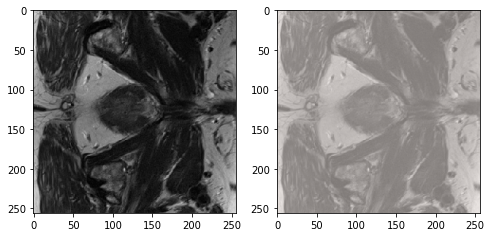

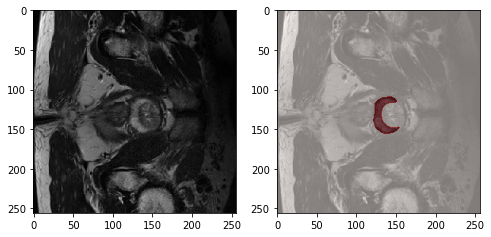

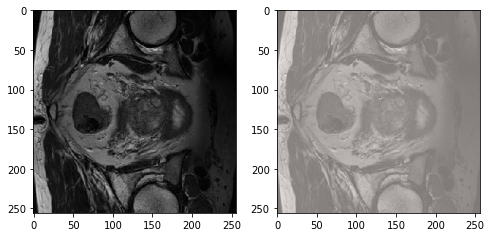

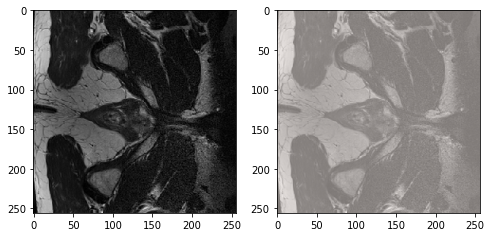

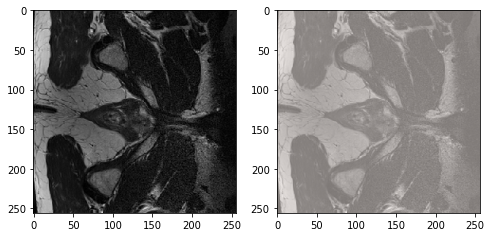

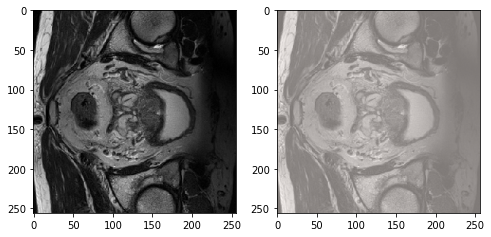

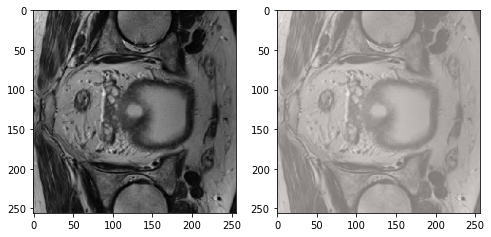

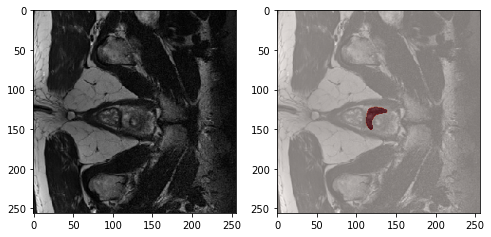

In [ ]:
n_sample = 8

samples = np.random.randint(0,80,n_sample)

images, predict = [],[]
for sample in samples:
  images.append(cv2.resize(np.load(np.array(test_slices)[sample])['img_0'],(size,size)))
  predict.append(y_pred[sample,0]>0.5)

print('          Raw Images        ,     Prediction Mask(Red)')
for idx in range(n_sample):
  if np.sum(predict[idx]) >= 0:
    plt.figure(figsize=(8,16))
    plt.subplot(1,2,1)
    plt.imshow(images[idx], cmap='gray')
    plt.subplot(1,2,2)
    plt.imshow(images[idx], cmap='gray')
    plt.imshow(predict[idx], alpha=0.5, cmap='Reds')
    plt.show()

In [ ]:
all_test_preds = np.empty((5,302,1,256,256))
all_test_preds.shape
all_test_preds[fold-1] = y_pred
all_test_preds.shape

(5, 302, 1, 256, 256)

In [ ]:
np.unique(y_pred).shape

(2551674,)

Bad Subjects:
Dice: 5.555524691529492e-06      00 [(0, '/content/drive/MyDrive/AI-Medic/Prostate/2D_Seg_Test/Data_Train/img_00_slice_10.npz')]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


Dice: 5.586589057771476e-07      10 [(20, '/content/drive/MyDrive/AI-Medic/Prostate/2D_Seg_Test/Data_Train/img_10_slice_04.npz')]
Dice: 0.3341902884155708      35 [(66, '/content/drive/MyDrive/AI-Medic/Prostate/2D_Seg_Test/Data_Train/img_35_slice_04.npz'), (67, '/content/drive/MyDrive/AI-Medic/Prostate/2D_Seg_Test/Data_Train/img_35_slice_10.npz'), (68, '/content/drive/MyDrive/AI-Medic/Prostate/2D_Seg_Test/Data_Train/img_35_slice_18.npz')]
Dice: 0.13404420662436378      38 [(73, '/content/drive/MyDrive/AI-Medic/Prostate/2D_Seg_Test/Data_Train/img_38_slice_00.npz'), (74, '/content/drive/MyDrive/AI-Medic/Prostate/2D_Seg_Test/Data_Train/img_38_slice_01.npz'), (75, '/content/drive/MyDrive/AI-Medic/Prostate/2D_Seg_Test/Data_Train/img_38_slice_03.npz'), (76, '/content/drive/MyDrive/AI-Medic/Prostate/2D_Seg_Test/Data_Train/img_38_slice_04.npz'), (77, '/content/drive/MyDrive/AI-Medic/Prostate/2D_Seg_Test/Data_Train/img_38_slice_13.npz'), (78, '/content/drive/MyDrive/AI-Medic/Prostate/2D_Seg_Tes

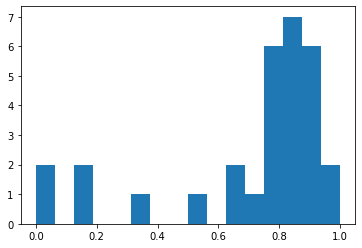

In [ ]:
print('Bad Subjects:')
model.eval()
bad_subs = []
with torch.no_grad():
    dices = np.array([])
    dices_good = np.array([])
    dice_metric = 0
    for sub, data in subject.items():
      y_pred = torch.tensor([], dtype=torch.float32, device=device)
      y = torch.tensor([], dtype=torch.long, device=device)
      for id, path in  data:
        val_img, val_mask = val_ds.__getitem__(id)
        val_img, val_mask = val_img.cuda(), val_mask.cuda()
        y_pred = torch.cat((y_pred, model(val_img[None,...])), 0)
        y = torch.cat((y, val_mask), 0)
      y_pred_np = y_pred.cpu().detach().numpy()
      y_np = y.cpu().detach().numpy()
      for i in range(y_pred_np.shape[0]):
        y_pred_np[i] = np.where(y_pred_np[i] > 0.5, 1, 0)
      d = dice(y_pred_np, y_np)
      dice_metric += d
      dices = np.append(dices, d)
      if d<0.5:
        print("Dice:",d,"    ",sub,data)
        bad_subs.extend(data)
      else:
        dices_good = np.append(dices_good,d)

    dice_metric /= len(subject.keys())

print(f'\n\nPer Subject Dice: {dice_metric} \n\nPer Subject Dice Without Bad Subjects: {np.mean(dices_good)}')
# total_dices.append(best_metrs[-1])
# persub_dices.append(dice_metric)
plt.hist(dices, bins=16)
plt.show()

# Final Dices

In [ ]:
all_dices = []
for fold in range(1,6):

  keep = 2
  if keep == 1:
    min = -90
    max = 916
  elif keep == 2:
    min = -26
    max = 700
  # fold = 1
  train_slices, val_slices = train_slices_all[fold-1], val_slices_all[fold-1]
  subject = subject_all[fold-1]
  phase='test'
  val_ds = CustomDataSet(val_slices, size, mean, std, phase)
  val_loader = DataLoader(val_ds, batch_size=16, num_workers=num_workers)

  model.load_state_dict(torch.load(root_dir +"best_metric_model_2D_"+str(keep)+"_fold_"+str(fold)+".pth"))
  model.eval()
  y_true = list()
  y_pred = list()
  # y_new_pred = list()
  with torch.no_grad():
      for val_data in val_loader:
          test_images, test_labels = val_data[0].to(device), val_data[1].to(device)
          pred = model(test_images)
          # new_pred = pred.argmax(dim=1)

          for i in range(len(pred)):
              y_true.append(test_labels[i].cpu().detach().numpy())
              y_pred.append(pred[i].cpu().detach().numpy())
              # y_new_pred.append(new_pred[i].cpu().detach().numpy())

  y_true = np.array(y_true)
  y_pred = np.array(y_pred)
  y_true.shape,y_pred.shape

  def dice(true,pred):
    smooth = 0.0001
    t = true.flatten()
    p = pred.flatten()
    d = (2 * (t*p).sum() + smooth)/(t.sum() + p.sum() + smooth)
    return d

  model.eval()
  bad_subs = []
  with torch.no_grad():
      dices = np.array([])
      dices_good = np.array([])
      dice_metric = 0
      for sub, data in subject.items():
        y_pred = torch.tensor([], dtype=torch.float32, device=device)
        y = torch.tensor([], dtype=torch.long, device=device)
        for id, path in  data:
          val_img, val_mask = val_ds.__getitem__(id)
          val_img, val_mask = val_img.cuda(), val_mask.cuda()
          y_pred = torch.cat((y_pred, model(val_img[None,...])), 0)
          y = torch.cat((y, val_mask), 0)
        y_pred_np = y_pred.cpu().detach().numpy()
        y_np = y.cpu().detach().numpy()
        for i in range(y_pred_np.shape[0]):
          y_pred_np[i] = np.where(y_pred_np[i] > 0.5, 1, 0)
        d = dice(y_pred_np, y_np)
        dice_metric += d
        dices = np.append(dices, d)
        if d<0.5:
          bad_subs.extend(data)
        else:
          dices_good = np.append(dices_good,d)

      dice_metric /= len(subject.keys())

  print(f'Per Subject Dice: {dice_metric}')
  # total_dices.append(best_metrs[-1])
  # persub_dices.append(dice_metric)
  all_dices.append(dice_metric)

print(all_dices)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


Per Subject Dice: 0.8504056645361938
Per Subject Dice: 0.8199564717881602
Per Subject Dice: 0.8619798863551587
Per Subject Dice: 0.8370167189137518
Per Subject Dice: 0.8682442192202519
[0.8504056645361938, 0.8199564717881602, 0.8619798863551587, 0.8370167189137518, 0.8682442192202519]


In [ ]:
all_dices_1 = [0.7025976 , 0.72466838, 0.70841117, 0.72840648, 0.66622981]

In [ ]:
all_dices_2 = [0.85040566, 0.81995647, 0.86197989, 0.83701672, 0.86824422]

# Final Test Evaluation

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide





Fold Number 1
          Raw Images        ,     Prediction Mask(Red)


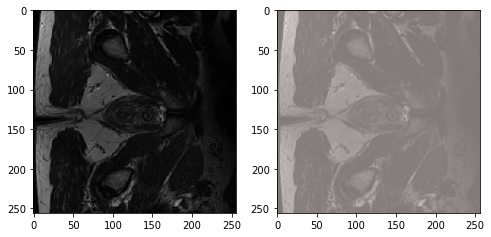

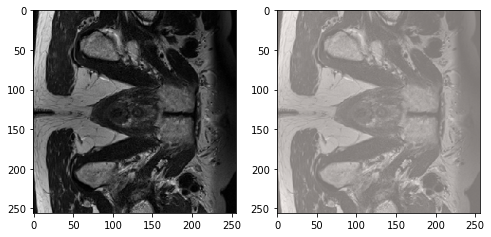

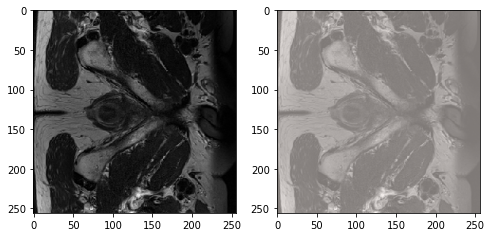

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide





Fold Number 2
          Raw Images        ,     Prediction Mask(Red)


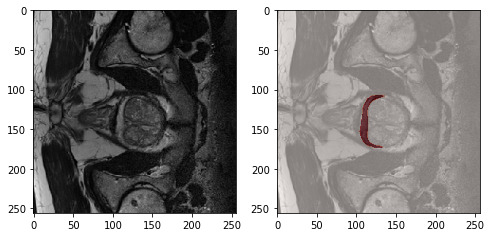

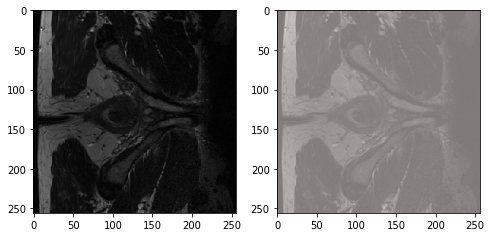

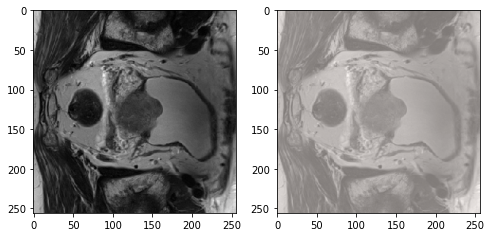

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide





Fold Number 3
          Raw Images        ,     Prediction Mask(Red)


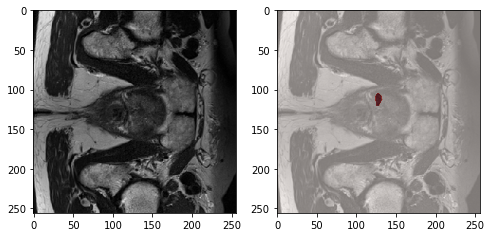

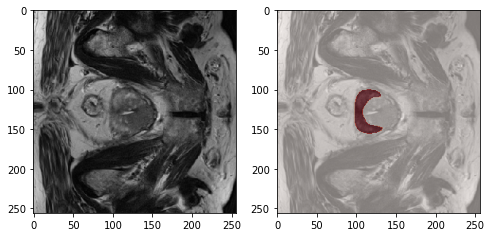

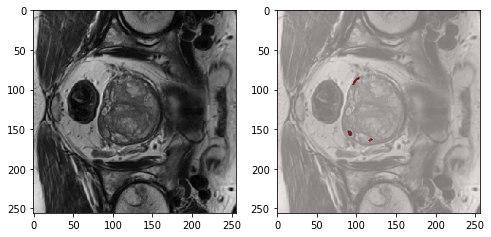

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide





Fold Number 4
          Raw Images        ,     Prediction Mask(Red)


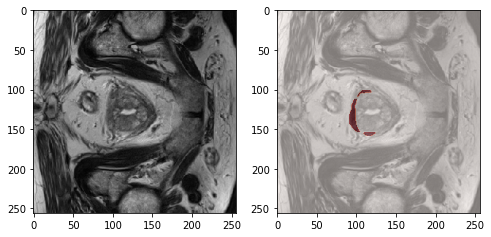

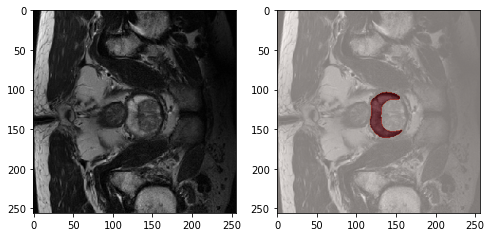

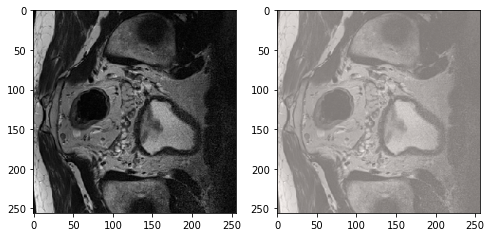

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide





Fold Number 5
          Raw Images        ,     Prediction Mask(Red)


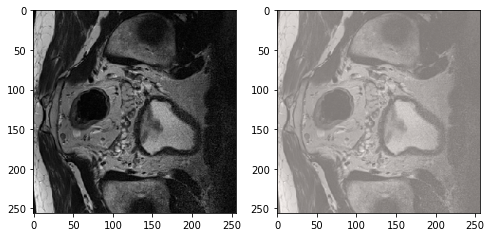

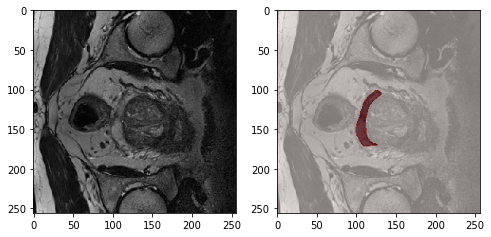

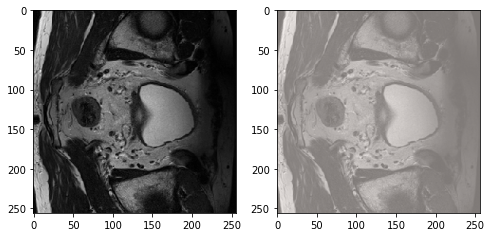

In [ ]:
all_test_preds = np.empty((5,302,1,256,256))
for fold in range(1,6):
  keep = 1
  # fold = 5
  train_slices, val_slices = train_slices_all[fold-1], val_slices_all[fold-1]
  subject = subject_all[fold-1]

  model.load_state_dict(torch.load(root_dir +"best_metric_model_2D_"+str(keep)+"_fold_"+str(fold)+".pth"))
  model.eval()
  y_true = list()
  y_pred = list()
  # y_new_pred = list()
  with torch.no_grad():
      for test_data in test_loader:
          test_images = test_data.to(device)
          pred = model(test_images)
          # new_pred = pred.argmax(dim=1)

          for i in range(len(pred)):
              # y_true.append(test_labels[i].cpu().detach().numpy())
              y_pred.append(pred[i].cpu().detach().numpy())
              # y_new_pred.append(new_pred[i].cpu().detach().numpy())

  # y_true = np.array(y_true)
  y_pred = np.array(y_pred)

  print(f'\n\n\nFold Number {fold}')
  ###########################
  n_sample = 3

  samples = np.random.randint(0,80,n_sample)

  images, predict = [],[]
  for sample in samples:
    images.append(cv2.resize(np.load(np.array(test_slices)[sample])['img_0'],(size,size)))
    predict.append(y_pred[sample,0]>0.5)

  print('          Raw Images        ,     Prediction Mask(Red)')
  for idx in range(n_sample):
    if np.sum(predict[idx]) >=0:
      plt.figure(figsize=(8,16))
      plt.subplot(1,2,1)
      plt.imshow(images[idx], cmap='gray')
      plt.subplot(1,2,2)
      plt.imshow(images[idx], cmap='gray')
      plt.imshow(predict[idx], alpha=0.5, cmap='Reds')
      plt.show()
  ###########################

  all_test_preds[fold-1] = y_pred

In [ ]:
all_test_preds_1 = all_test_preds

In [ ]:
results_1 = all_test_preds_1[:,:,0,:,:]
results_2 = all_test_preds_2[:,:,0,:,:]





Fold Number 1
          Raw Images        ,     Prediction Mask(Red)


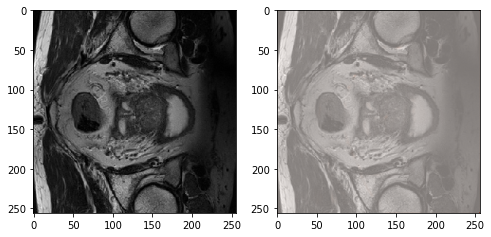

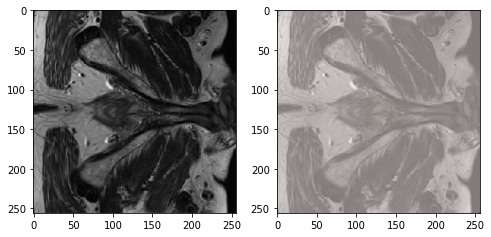

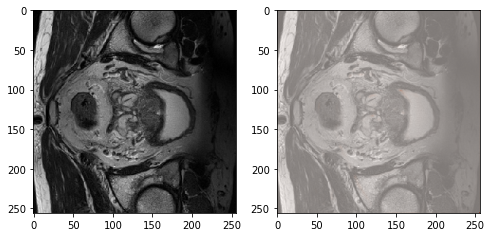




Fold Number 2
          Raw Images        ,     Prediction Mask(Red)


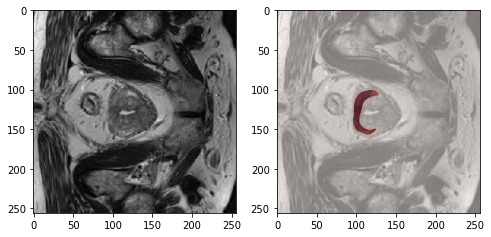

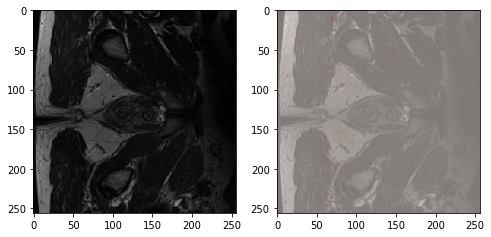

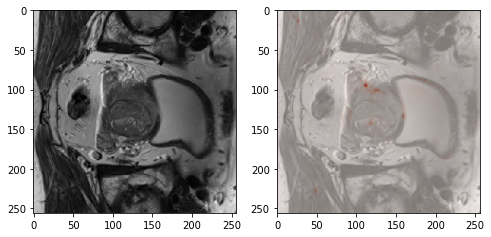




Fold Number 3
          Raw Images        ,     Prediction Mask(Red)


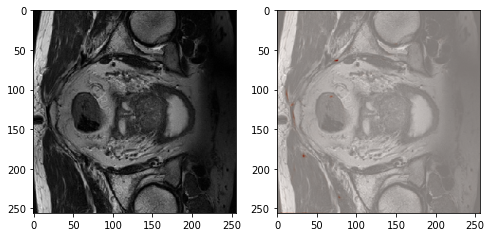

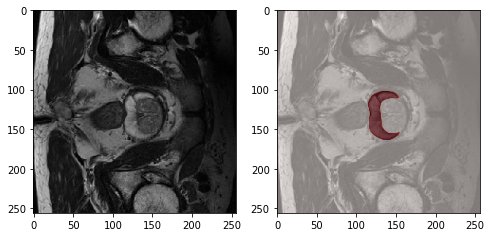

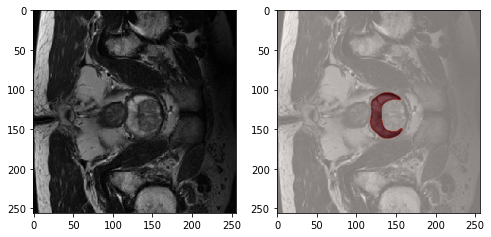




Fold Number 4
          Raw Images        ,     Prediction Mask(Red)


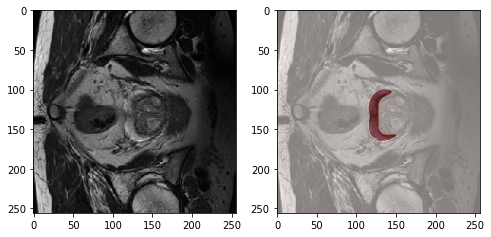

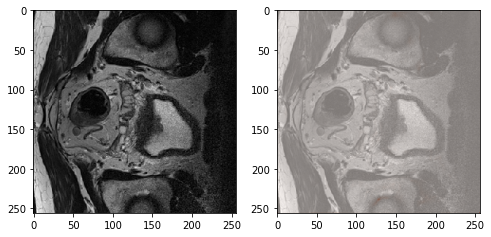

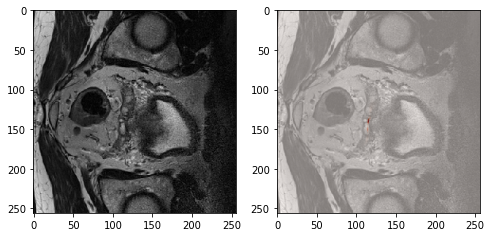




Fold Number 5
          Raw Images        ,     Prediction Mask(Red)


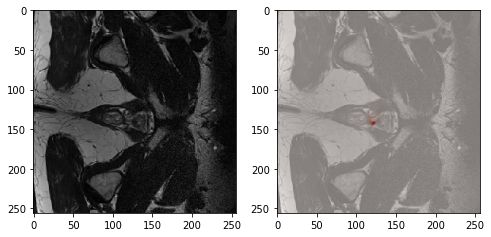

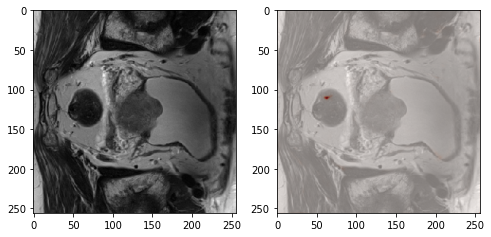

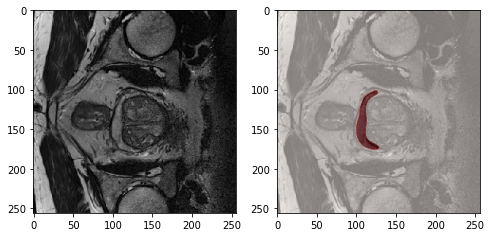

In [ ]:
for fold in range(5):
  print(f'\n\n\nFold Number {fold+1}')
  y_pred = results_1[fold]
  n_sample = 3

  samples = np.random.randint(0,80,n_sample)

  images, predict = [],[]
  for sample in samples:
    images.append(cv2.resize(np.load(np.array(test_slices)[sample])['img_0'],(size,size)))
    predict.append(y_pred[sample])

  print('          Raw Images        ,     Prediction Mask(Red)')
  for idx in range(n_sample):
    if np.sum(predict[idx]) >= 0:
      plt.figure(figsize=(8,16))
      plt.subplot(1,2,1)
      plt.imshow(images[idx], cmap='gray')
      plt.subplot(1,2,2)
      plt.imshow(images[idx], cmap='gray')
      plt.imshow(predict[idx], alpha=0.5, cmap='Reds')
      plt.show()




Fold Number 1
          Raw Images        ,     Prediction Mask(Red)


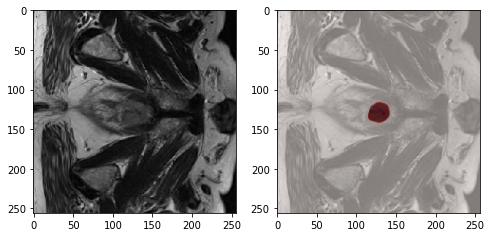

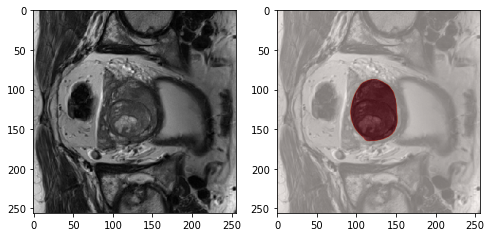

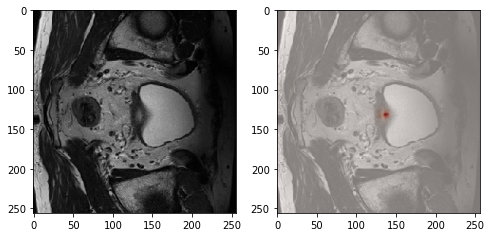




Fold Number 2
          Raw Images        ,     Prediction Mask(Red)


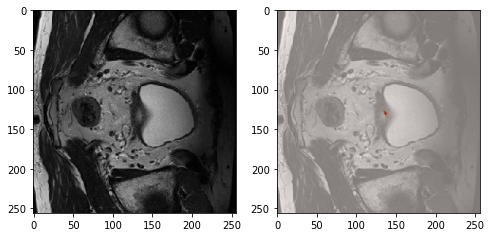

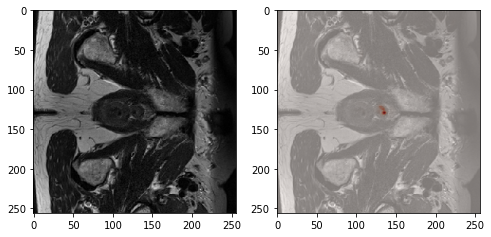

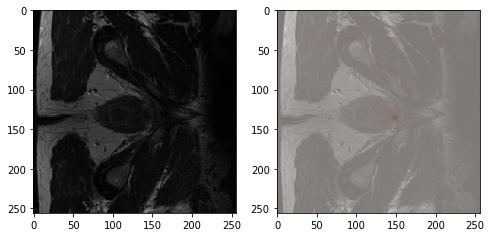




Fold Number 3
          Raw Images        ,     Prediction Mask(Red)


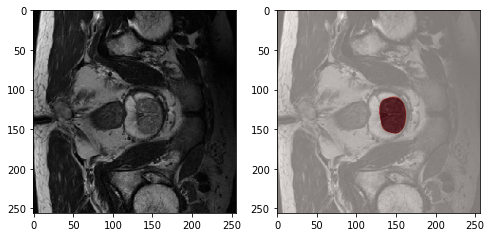

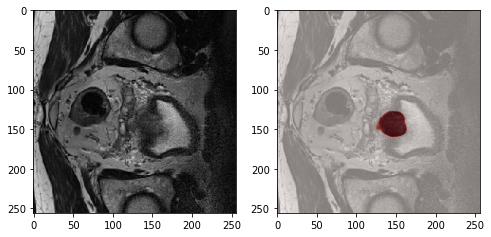

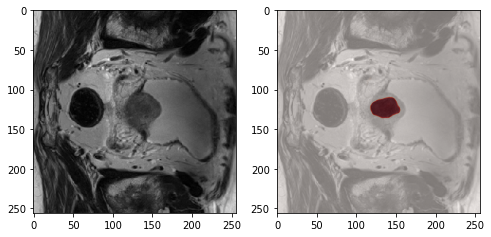




Fold Number 4
          Raw Images        ,     Prediction Mask(Red)


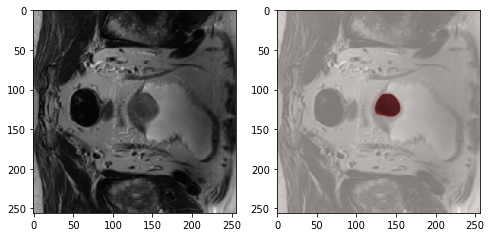

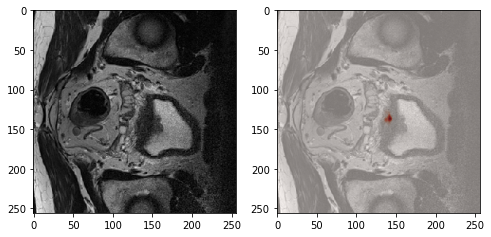

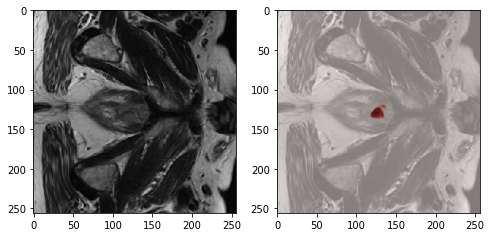




Fold Number 5
          Raw Images        ,     Prediction Mask(Red)


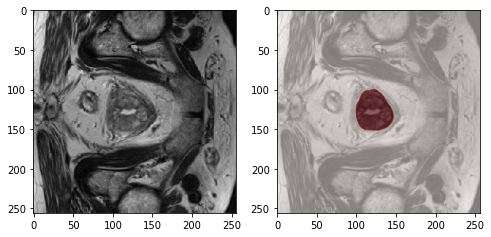

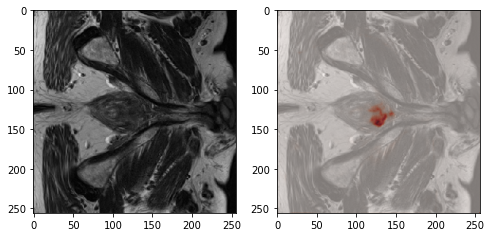

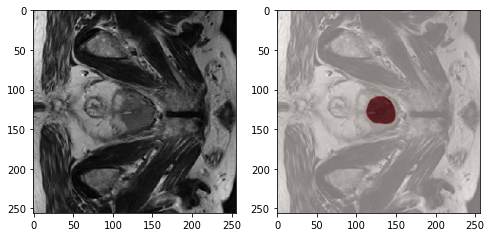

In [ ]:
for fold in range(5):
  print(f'\n\n\nFold Number {fold+1}')
  y_pred = results_2[fold]
  n_sample = 3

  samples = np.random.randint(0,80,n_sample)

  images, predict = [],[]
  for sample in samples:
    images.append(cv2.resize(np.load(np.array(test_slices)[sample])['img_0'],(size,size)))
    predict.append(y_pred[sample])

  print('          Raw Images        ,     Prediction Mask(Red)')
  for idx in range(n_sample):
    if np.sum(predict[idx]) >= 0:
      plt.figure(figsize=(8,16))
      plt.subplot(1,2,1)
      plt.imshow(images[idx], cmap='gray')
      plt.subplot(1,2,2)
      plt.imshow(images[idx], cmap='gray')
      plt.imshow(predict[idx], alpha=0.5, cmap='Reds')
      plt.show()

In [ ]:
print(results_1.shape)
print(results_2.shape)

(5, 302, 256, 256)
(5, 302, 256, 256)


# Best Dice Results

In [ ]:
best_dice_results_1 = results_1[3]
best_dice_results_2 = results_2[4]

# Mean and Weighted Results

In [ ]:
mean_dice_results_1 = np.zeros((302,256,256))
mean_dice_results_2 = np.zeros((302,256,256))
weighted_dice_results_1 = np.zeros((302,256,256))
weighted_dice_results_2 = np.zeros((302,256,256))

for fold in range(5):
  mean_dice_results_1 += results_1[fold]
  mean_dice_results_2 += results_2[fold]
  weighted_dice_results_1 += results_1[fold] * all_dices_1[fold]
  weighted_dice_results_2 += results_2[fold] * all_dices_2[fold]

mean_dice_results_1 /= 5
mean_dice_results_2 /= 5
weighted_dice_results_1 /= np.sum(all_dices_1)
weighted_dice_results_2 /= np.sum(all_dices_2)

        Raw Images          ,             Best          ,              Mean     ,               Weighted    


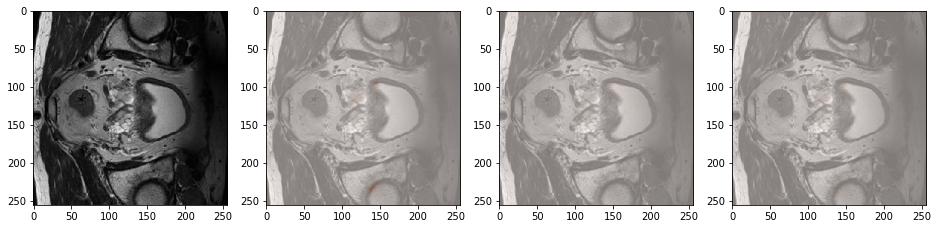

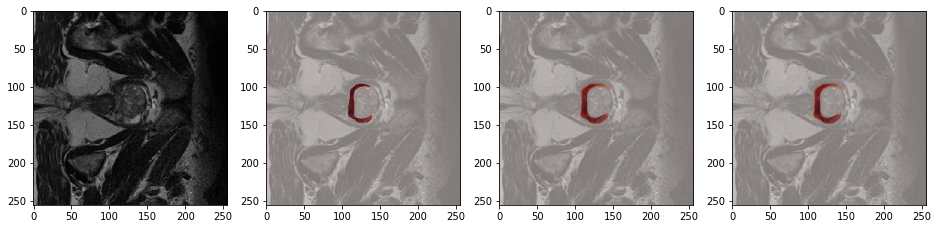

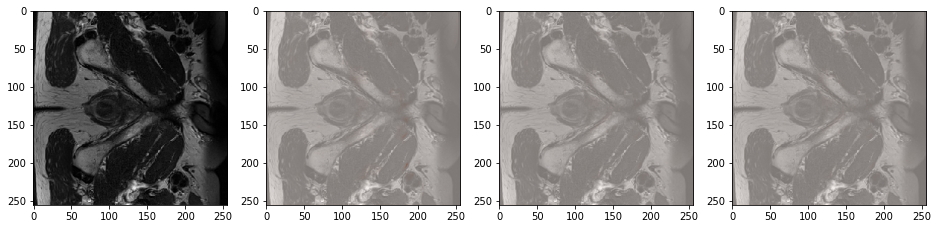

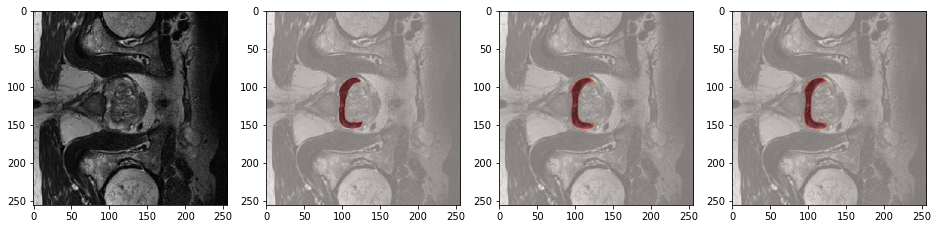

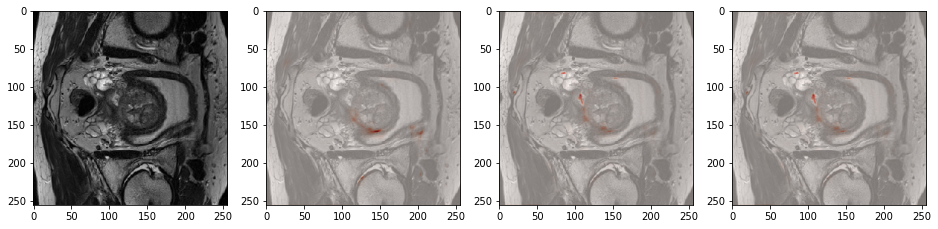

In [ ]:
y_best = best_dice_results_1
y_mean = mean_dice_results_1
y_weighted = weighted_dice_results_1

n_sample = 5
np.random.seed(1)
samples = np.random.randint(0,302,n_sample)

images, pred_best, pred_mean, pred_weighted = [],[],[],[]
for sample in samples:
  images.append(cv2.resize(np.load(np.array(test_slices)[sample])['img_0'],(size,size)))
  pred_best.append(y_best[sample])
  pred_mean.append(y_mean[sample])
  pred_weighted.append(y_weighted[sample])

print('        Raw Images          ,             Best          ,              Mean     ,               Weighted    ')
for idx in range(n_sample):
  if np.sum(pred_best[idx]) >= 0:
    plt.figure(figsize=(16,64))
    plt.subplot(1,4,1)
    plt.imshow(images[idx], cmap='gray')
    plt.subplot(1,4,2)
    plt.imshow(images[idx], cmap='gray')
    plt.imshow(pred_best[idx], alpha=0.5, cmap='Reds')
    plt.subplot(1,4,3)
    plt.imshow(images[idx], cmap='gray')
    plt.imshow(pred_mean[idx], alpha=0.5, cmap='Reds')
    plt.subplot(1,4,4)
    plt.imshow(images[idx], cmap='gray')
    plt.imshow(pred_weighted[idx], alpha=0.5, cmap='Reds')
    plt.show()

        Raw Images          ,             Best          ,              Mean     ,               Weighted    


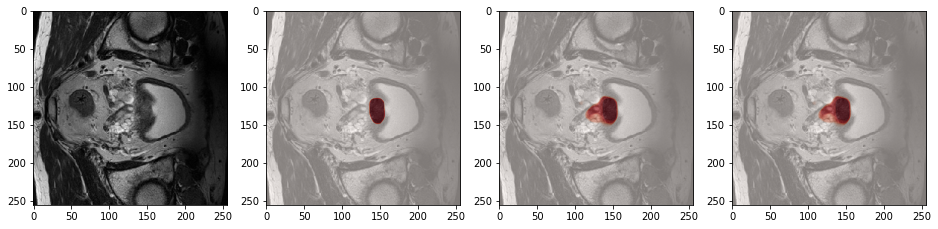

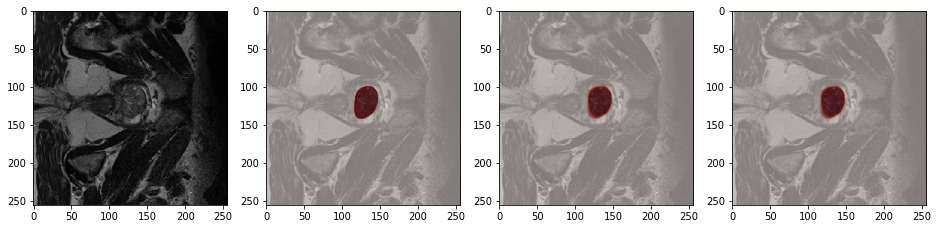

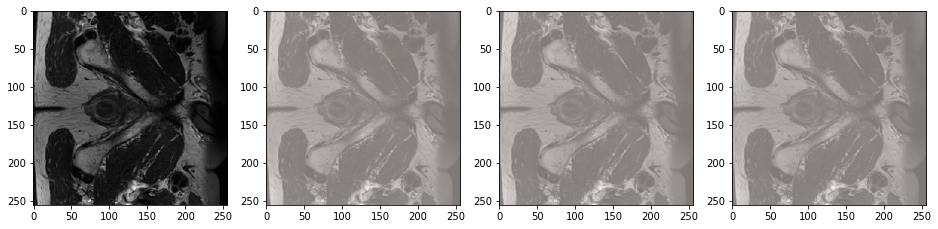

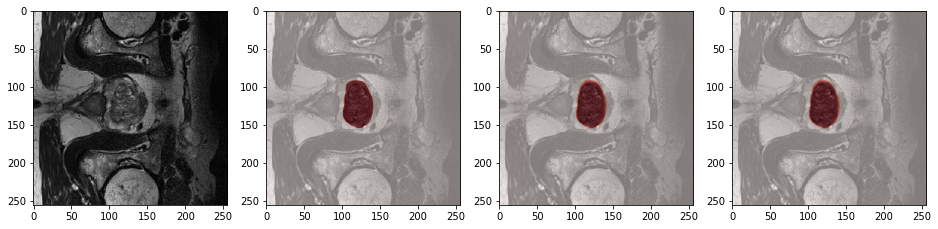

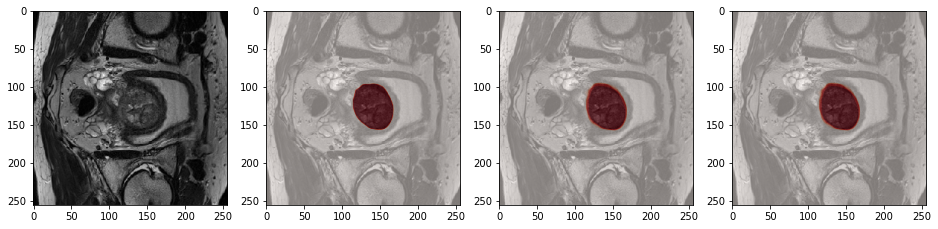

In [ ]:
y_best = best_dice_results_2
y_mean = mean_dice_results_2
y_weighted = weighted_dice_results_2

n_sample = 5
np.random.seed(1)
samples = np.random.randint(0,302,n_sample)

images, pred_best, pred_mean, pred_weighted = [],[],[],[]
for sample in samples:
  images.append(cv2.resize(np.load(np.array(test_slices)[sample])['img_0'],(size,size)))
  pred_best.append(y_best[sample])
  pred_mean.append(y_mean[sample])
  pred_weighted.append(y_weighted[sample])

print('        Raw Images          ,             Best          ,              Mean     ,               Weighted    ')
for idx in range(n_sample):
  if np.sum(pred_best[idx]) >= 0:
    plt.figure(figsize=(16,64))
    plt.subplot(1,4,1)
    plt.imshow(images[idx], cmap='gray')
    plt.subplot(1,4,2)
    plt.imshow(images[idx], cmap='gray')
    plt.imshow(pred_best[idx], alpha=0.5, cmap='Reds')
    plt.subplot(1,4,3)
    plt.imshow(images[idx], cmap='gray')
    plt.imshow(pred_mean[idx], alpha=0.5, cmap='Reds')
    plt.subplot(1,4,4)
    plt.imshow(images[idx], cmap='gray')
    plt.imshow(pred_weighted[idx], alpha=0.5, cmap='Reds')
    plt.show()

In [ ]:
from scipy.ndimage import interpolation
z = interpolation.zoom(best_dice_results_1, [1,320/256,320/256])
z.shape

(302, 320, 320)

[3.92364408e-09 4.77275952e-09 4.91268626e-09 ... 9.99999762e-01
 9.99999881e-01 1.00000000e+00]


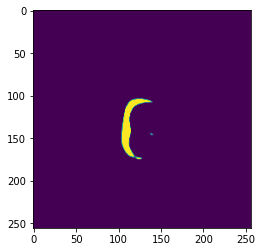

In [ ]:
best_dice_results = best_dice_results_1
best_dice_results = interpolation.zoom(best_dice_results, [1,320/256,320/256])
best_dice_results = np.expand_dims(best_dice_results, axis=0)
best_dice_results_temp = best_dice_results_2
best_dice_results_temp = interpolation.zoom(best_dice_results_temp, [1,320/256,320/256])
best_dice_results_temp = np.expand_dims(best_dice_results_temp, axis=0)
best_dice_results = np.append(best_dice_results, best_dice_results_temp, axis=0)
best_dice_results_final = np.zeros(best_dice_results.shape[1:])
for slice_num in range(best_dice_results.shape[1]):
  label_1 = best_dice_results[0,slice_num,:,:]
  label_2 = best_dice_results[1,slice_num,:,:]
  label_final = np.zeros((320,320))
  for i in range(320):
    for j in range(320):
      if label_1[i,j] < 0.2 and label_2[i,j] <= 0.2:
        continue
      if label_1[i,j] >= label_2[i,j]:
        label_final[i,j] = 1
      else:
        label_final[i,j] = 2
  best_dice_results_final[slice_num,:,:] = label_final

print(best_dice_results_final.shape)
np.unique(best_dice_results_final)

(302, 320, 320)


array([0., 1., 2.])

In [ ]:
best_dice_results = mean_dice_results_1
best_dice_results = interpolation.zoom(best_dice_results, [1,320/256,320/256])
best_dice_results = np.expand_dims(best_dice_results, axis=0)
best_dice_results_temp = mean_dice_results_2
best_dice_results_temp = interpolation.zoom(best_dice_results_temp, [1,320/256,320/256])
best_dice_results_temp = np.expand_dims(best_dice_results_temp, axis=0)
best_dice_results = np.append(best_dice_results, best_dice_results_temp, axis=0)
mean_dice_results_final = np.zeros(best_dice_results.shape[1:])
for slice_num in range(best_dice_results.shape[1]):
  label_1 = best_dice_results[0,slice_num,:,:]
  label_2 = best_dice_results[1,slice_num,:,:]
  label_final = np.zeros((320,320))
  for i in range(320):
    for j in range(320):
      if label_1[i,j] < 0.2 and label_2[i,j] <= 0.2:
        continue
      if label_1[i,j] >= label_2[i,j]:
        label_final[i,j] = 1
      else:
        label_final[i,j] = 2
  mean_dice_results_final[slice_num,:,:] = label_final

print(mean_dice_results_final.shape)
np.unique(mean_dice_results_final)

(302, 320, 320)


array([0., 1., 2.])

In [ ]:
best_dice_results = weighted_dice_results_1
best_dice_results = interpolation.zoom(best_dice_results, [1,320/256,320/256])
best_dice_results = np.expand_dims(best_dice_results, axis=0)
best_dice_results_temp = weighted_dice_results_2
best_dice_results_temp = interpolation.zoom(best_dice_results_temp, [1,320/256,320/256])
best_dice_results_temp = np.expand_dims(best_dice_results_temp, axis=0)
best_dice_results = np.append(best_dice_results, best_dice_results_temp, axis=0)
weighted_dice_results_final = np.zeros(best_dice_results.shape[1:])
for slice_num in range(best_dice_results.shape[1]):
  label_1 = best_dice_results[0,slice_num,:,:]
  label_2 = best_dice_results[1,slice_num,:,:]
  label_final = np.zeros((320,320))
  for i in range(320):
    for j in range(320):
      if label_1[i,j] < 0.2 and label_2[i,j] <= 0.2:
        continue
      if label_1[i,j] >= label_2[i,j]:
        label_final[i,j] = 1
      else:
        label_final[i,j] = 2
  weighted_dice_results_final[slice_num,:,:] = label_final

print(weighted_dice_results_final.shape)
np.unique(weighted_dice_results_final)

(302, 320, 320)


array([0., 1., 2.])

In [ ]:
np.unique(best_dice_results_final)

array([0., 1., 2.])

        Raw Images          ,             Best          ,              Mean     ,               Weighted    
False
False
False


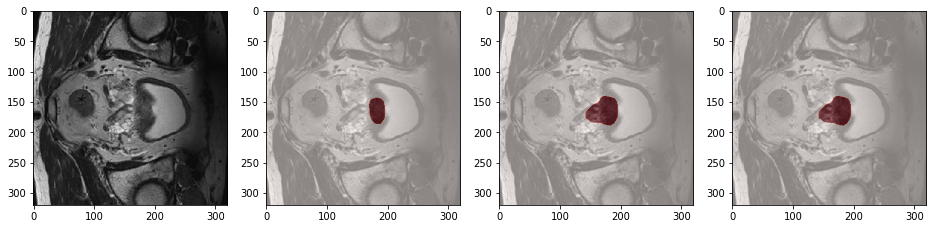

False
False
True


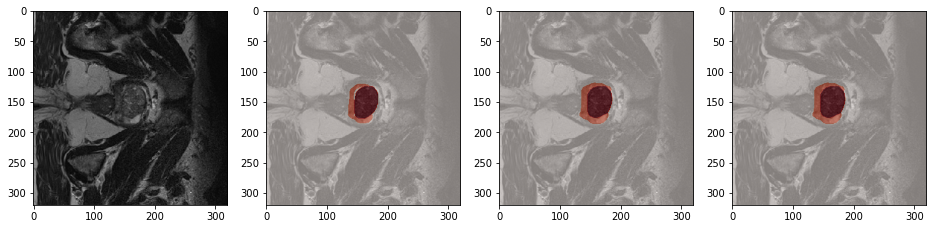

True
True
True


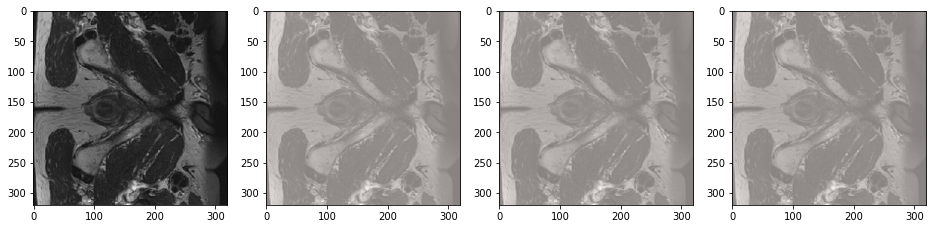

False
False
False


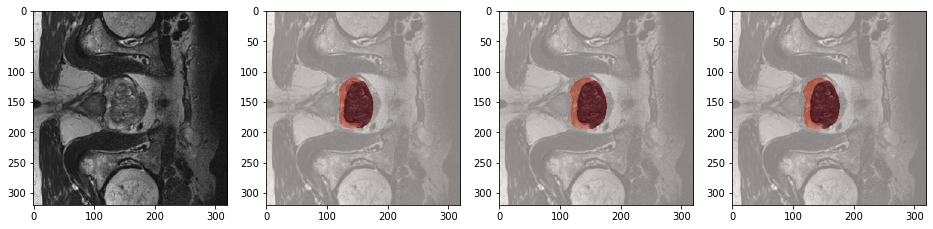

False
False
False


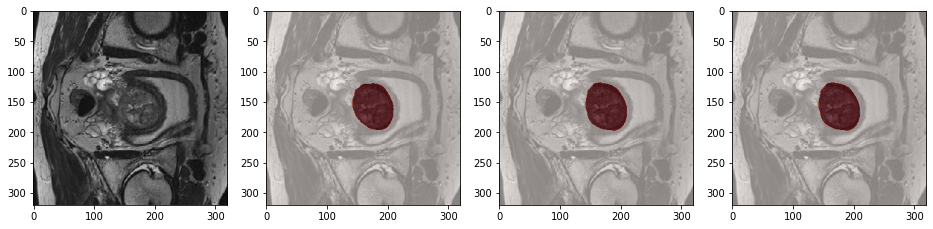

In [ ]:
y_best = best_dice_results_final
y_mean = mean_dice_results_final
y_weighted = weighted_dice_results_final

n_sample = 5
np.random.seed(1)
samples = np.random.randint(0,302,n_sample)

images, pred_best, pred_mean, pred_weighted = [],[],[],[]
for sample in samples:
  images.append(ndimage.zoom(np.load(np.array(test_slices)[sample])['img_0'], 320/256))
  pred_best.append(y_best[sample])
  pred_mean.append(y_mean[sample])
  pred_weighted.append(y_weighted[sample])

print('        Raw Images          ,             Best          ,              Mean     ,               Weighted    ')
for idx in range(n_sample):
  if np.sum(pred_best[idx]) >= 0:
    print(np.array_equal(pred_best[idx], pred_mean[idx]))
    print(np.array_equal(pred_best[idx], pred_weighted[idx]))
    print(np.array_equal(pred_weighted[idx], pred_mean[idx]))
    # print(np.unique(pred_best[idx]))
    plt.figure(figsize=(16,64))
    plt.subplot(1,4,1)
    plt.imshow(images[idx], cmap='gray')
    plt.subplot(1,4,2)
    plt.imshow(images[idx], cmap='gray')
    plt.imshow(pred_best[idx], alpha=0.5, cmap='Reds')
    plt.subplot(1,4,3)
    plt.imshow(images[idx], cmap='gray')
    plt.imshow(pred_mean[idx], alpha=0.5, cmap='Reds')
    plt.subplot(1,4,4)
    plt.imshow(images[idx], cmap='gray')
    plt.imshow(pred_weighted[idx], alpha=0.5, cmap='Reds')
    plt.show()

In [ ]:
final_best_dice_results_1 = np.where(best_dice_results_1 > 0.5, 1, 0)
final_mean_dice_results_1 = np.where(mean_dice_results_1 > 0.5, 1, 0)
final_weighted_dice_results_1 = np.where(weighted_dice_results_1 > 0.5, 1, 0)

final_best_dice_results_2 = np.where(best_dice_results_2 > 0.5, 1, 0)
final_mean_dice_results_2 = np.where(mean_dice_results_2 > 0.5, 1, 0)
final_weighted_dice_results_2 = np.where(weighted_dice_results_2 > 0.5, 1, 0)

        Raw Images          ,             Best          ,              Mean     ,               Weighted    


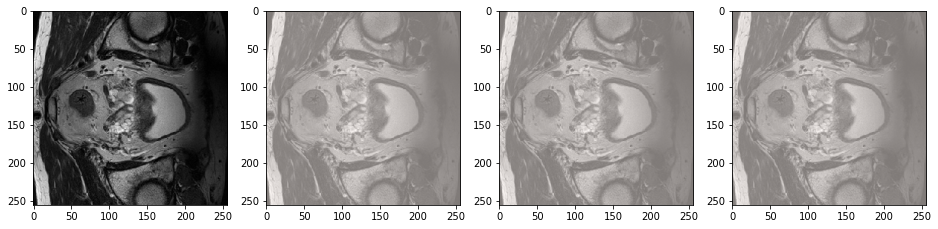

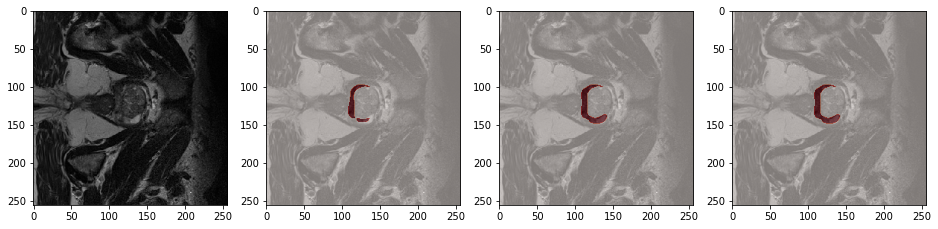

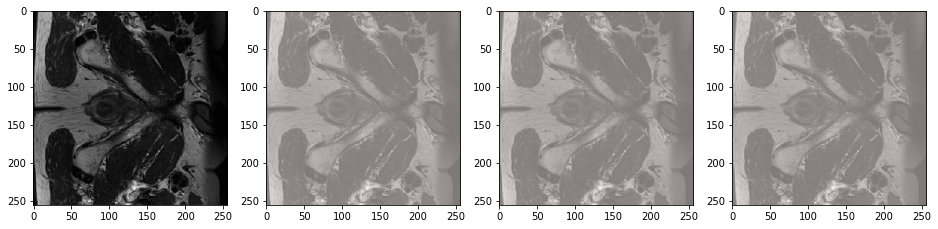

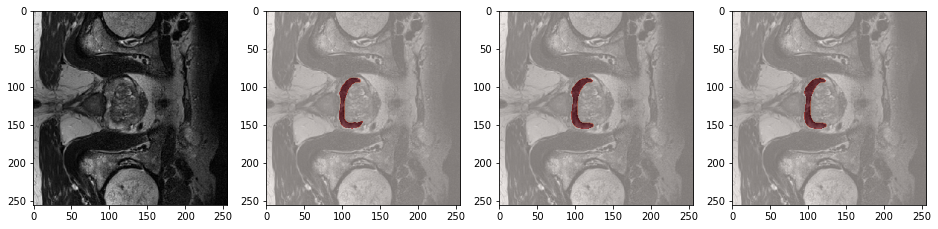

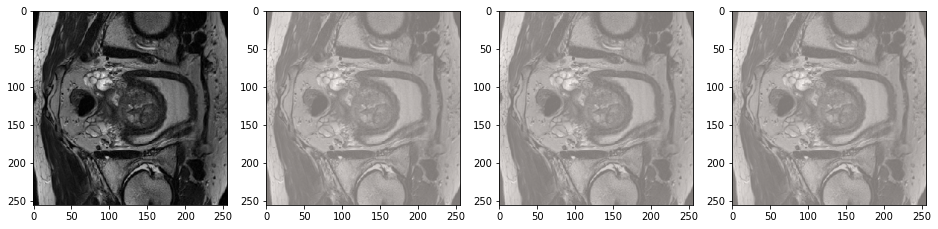

In [ ]:
y_best = final_best_dice_results_1
y_mean = final_mean_dice_results_1
y_weighted = final_weighted_dice_results_1

n_sample = 5
np.random.seed(1)
samples = np.random.randint(0,302,n_sample)

images, pred_best, pred_mean, pred_weighted = [],[],[],[]
for sample in samples:
  images.append(cv2.resize(np.load(np.array(test_slices)[sample])['img_0'],(size,size)))
  pred_best.append(y_best[sample])
  pred_mean.append(y_mean[sample])
  pred_weighted.append(y_weighted[sample])

print('        Raw Images          ,             Best          ,              Mean     ,               Weighted    ')
for idx in range(n_sample):
  if np.sum(pred_best[idx]) >= 0:
    plt.figure(figsize=(16,64))
    plt.subplot(1,4,1)
    plt.imshow(images[idx], cmap='gray')
    plt.subplot(1,4,2)
    plt.imshow(images[idx], cmap='gray')
    plt.imshow(pred_best[idx], alpha=0.5, cmap='Reds')
    plt.subplot(1,4,3)
    plt.imshow(images[idx], cmap='gray')
    plt.imshow(pred_mean[idx], alpha=0.5, cmap='Reds')
    plt.subplot(1,4,4)
    plt.imshow(images[idx], cmap='gray')
    plt.imshow(pred_weighted[idx], alpha=0.5, cmap='Reds')
    plt.show()

        Raw Images          ,             Best          ,              Mean     ,               Weighted    


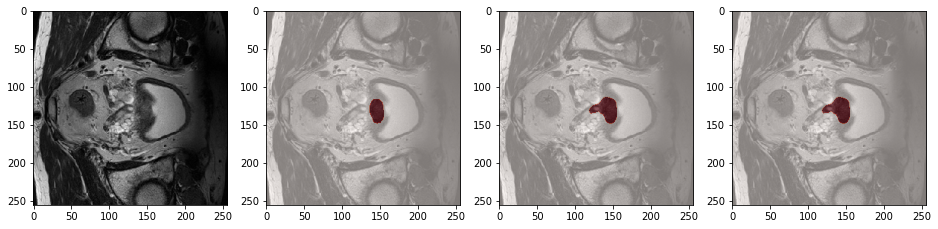

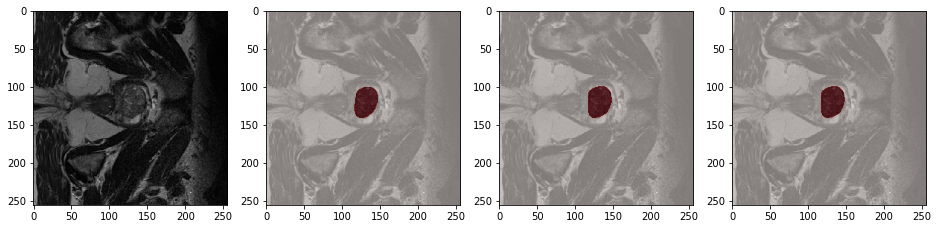

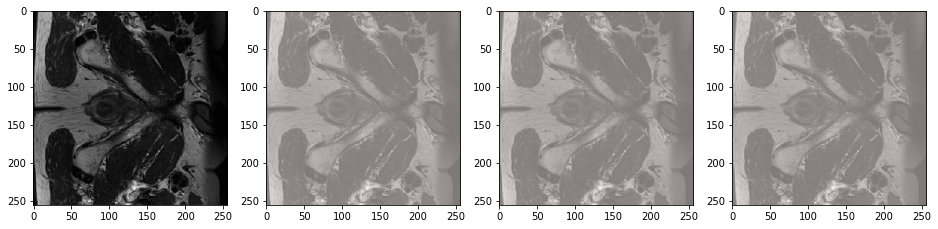

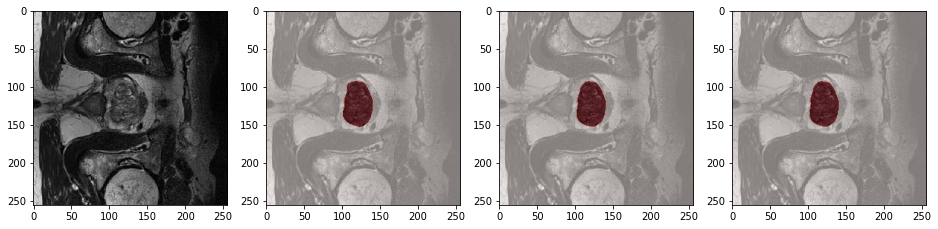

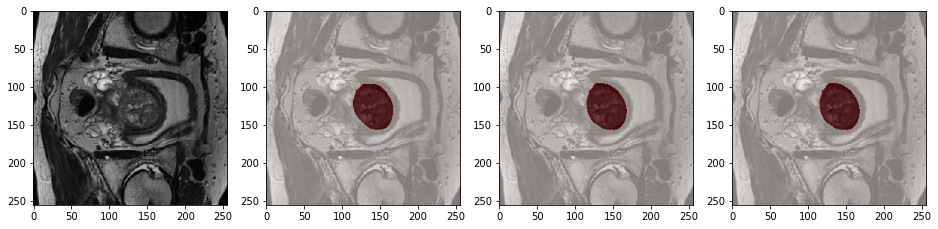

In [ ]:
y_best = final_best_dice_results_2
y_mean = final_mean_dice_results_2
y_weighted = final_weighted_dice_results_2

n_sample = 5
np.random.seed(1)
samples = np.random.randint(0,302,n_sample)

images, pred_best, pred_mean, pred_weighted = [],[],[],[]
for sample in samples:
  images.append(cv2.resize(np.load(np.array(test_slices)[sample])['img_0'],(size,size)))
  pred_best.append(y_best[sample])
  pred_mean.append(y_mean[sample])
  pred_weighted.append(y_weighted[sample])

print('        Raw Images          ,             Best          ,              Mean     ,               Weighted    ')
for idx in range(n_sample):
  if np.sum(pred_best[idx]) >= 0:
    plt.figure(figsize=(16,64))
    plt.subplot(1,4,1)
    plt.imshow(images[idx], cmap='gray')
    plt.subplot(1,4,2)
    plt.imshow(images[idx], cmap='gray')
    plt.imshow(pred_best[idx], alpha=0.5, cmap='Reds')
    plt.subplot(1,4,3)
    plt.imshow(images[idx], cmap='gray')
    plt.imshow(pred_mean[idx], alpha=0.5, cmap='Reds')
    plt.subplot(1,4,4)
    plt.imshow(images[idx], cmap='gray')
    plt.imshow(pred_weighted[idx], alpha=0.5, cmap='Reds')
    plt.show()

# Final Binary Masks

In [ ]:
final_best_dice_results_2 #Best Dice Predictions
final_mean_dice_results_2 #K-Fold Mean Predictions
final_weighted_dice_results_2 #K-Fold Weighted Mean Predictions

In [ ]:
final_best_dice_results_2.shape

(302, 256, 256)

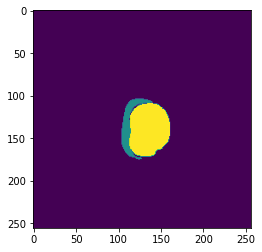

In [ ]:
plt.imshow(best_dice_results_final[10,:,:])

<class 'numpy.ndarray'>
(256, 256)
(284, 284)
[0. 1. 2.]
[-0.37868456 -0.31576025 -0.25228183 ...  2.38167803  2.47544631
  2.50869125]


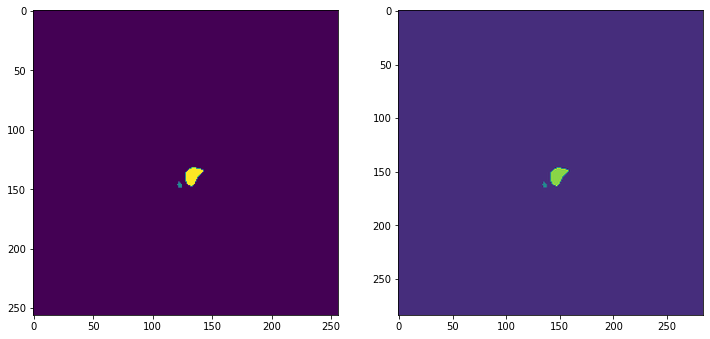

In [ ]:
from scipy import ndimage, misc
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(12,24))
ax1 = fig.add_subplot(121)  # left side
ax2 = fig.add_subplot(122)  # right side
ascent = best_dice_results_final[2]
print(type(ascent))
print(ascent.shape)
#{‘reflect’, ‘grid-mirror’, ‘constant’, ‘grid-constant’, ‘nearest’, ‘mirror’, ‘grid-wrap’, ‘wrap’}
result = ndimage.zoom(ascent, 284/256, mode='wrap')
print(result.shape)
print(np.unique(ascent))
print(np.unique(result))
ax1.imshow(ascent)
ax2.imshow(result)
plt.show()

In [ ]:
test_subject = {}
for i,path in enumerate(test_slices):
  id = path[-15:-13]
  test_subject[id] = test_subject.get(id, []) + [(i,path)] 
print(test_subject)
x = [int(i) for i in list(test_subject.keys())]
print(sorted(x))
print(test_subject.keys())

{'03': [(0, '/content/drive/MyDrive/AI-Medic/Prostate/2D_Seg_Test/Data_Test/img_03_slice_00.npz'), (1, '/content/drive/MyDrive/AI-Medic/Prostate/2D_Seg_Test/Data_Test/img_03_slice_01.npz'), (2, '/content/drive/MyDrive/AI-Medic/Prostate/2D_Seg_Test/Data_Test/img_03_slice_02.npz'), (3, '/content/drive/MyDrive/AI-Medic/Prostate/2D_Seg_Test/Data_Test/img_03_slice_03.npz'), (4, '/content/drive/MyDrive/AI-Medic/Prostate/2D_Seg_Test/Data_Test/img_03_slice_04.npz'), (5, '/content/drive/MyDrive/AI-Medic/Prostate/2D_Seg_Test/Data_Test/img_03_slice_05.npz'), (6, '/content/drive/MyDrive/AI-Medic/Prostate/2D_Seg_Test/Data_Test/img_03_slice_06.npz'), (7, '/content/drive/MyDrive/AI-Medic/Prostate/2D_Seg_Test/Data_Test/img_03_slice_07.npz'), (8, '/content/drive/MyDrive/AI-Medic/Prostate/2D_Seg_Test/Data_Test/img_03_slice_08.npz'), (9, '/content/drive/MyDrive/AI-Medic/Prostate/2D_Seg_Test/Data_Test/img_03_slice_09.npz'), (10, '/content/drive/MyDrive/AI-Medic/Prostate/2D_Seg_Test/Data_Test/img_03_slice_

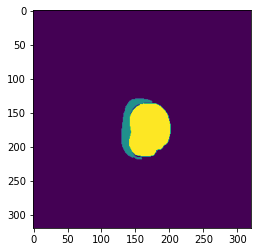

In [ ]:
plt.imshow(best_dice_results_final[10,:,:])

In [ ]:
best_dice_reshape = np.empty((320,320,302))
mean_dice_reshape = np.empty((320,320,302))
weighted_dice_reshape = np.empty((320,320,302))
for i in range(302):
  best_dice_reshape[:,:,i] = best_dice_results_final[i,:,:]
  mean_dice_reshape[:,:,i] = mean_dice_results_final[i,:,:]
  weighted_dice_reshape[:,:,i] = weighted_dice_results_final[i,:,:]

In [ ]:
slice_num = 0
for sub in test_subject.keys():
  img = nib.load('/content/drive/MyDrive/AI-Medic/Prostate/Task05_Prostate/imagesTs/prostate_'+str(sub).zfill(2)+'.nii.gz')
  data = img.get_fdata()
  save_path = '/content/drive/MyDrive/AI-Medic/Prostate/Task05_Prostate/###/prostate_'+str(sub).zfill(2)+'.nii.gz'
  slices = data.shape[-2]
  print(data.shape)
  print(f'case #{sub} has slices {slice_num} to {slice_num + slices}')
  best_save = best_dice_reshape[:,:,slice_num:slice_num+slices]
  best_save = nib.Nifti1Image(best_save, img.affine)
  sp_best = save_path.replace('###', 'labelsTs_best')
  nib.save(best_save, sp_best)
  print(f'saved best fold for case #{sub} at {sp_best}')

  mean_save = mean_dice_reshape[:,:,slice_num:slice_num+slices]
  mean_save = nib.Nifti1Image(mean_save, img.affine)
  sp_mean = save_path.replace('###', 'labelsTs_mean')
  nib.save(mean_save, sp_mean)
  print(f'saved mean for case #{sub} at {sp_mean}')

  weighted_save = weighted_dice_reshape[:,:,slice_num:slice_num+slices]
  weighted_save = nib.Nifti1Image(weighted_save, img.affine)
  sp_weighted = save_path.replace('###', 'labelsTs_weighted')
  nib.save(weighted_save, sp_weighted)
  print(f'saved weighted mean for case #{sub} at {sp_weighted}\n')

  slice_num += slices


(320, 320, 20, 2)
case #03 has slices 0 to 20
saved best fold for case #03 at /content/drive/MyDrive/AI-Medic/Prostate/Task05_Prostate/labelsTs_best/prostate_03.nii.gz
saved mean for case #03 at /content/drive/MyDrive/AI-Medic/Prostate/Task05_Prostate/labelsTs_mean/prostate_03.nii.gz
saved weighted mean for case #03 at /content/drive/MyDrive/AI-Medic/Prostate/Task05_Prostate/labelsTs_weighted/prostate_03.nii.gz

(320, 320, 20, 2)
case #05 has slices 20 to 40
saved best fold for case #05 at /content/drive/MyDrive/AI-Medic/Prostate/Task05_Prostate/labelsTs_best/prostate_05.nii.gz
saved mean for case #05 at /content/drive/MyDrive/AI-Medic/Prostate/Task05_Prostate/labelsTs_mean/prostate_05.nii.gz
saved weighted mean for case #05 at /content/drive/MyDrive/AI-Medic/Prostate/Task05_Prostate/labelsTs_weighted/prostate_05.nii.gz

(320, 320, 15, 2)
case #08 has slices 40 to 55
saved best fold for case #08 at /content/drive/MyDrive/AI-Medic/Prostate/Task05_Prostate/labelsTs_best/prostate_08.nii.g

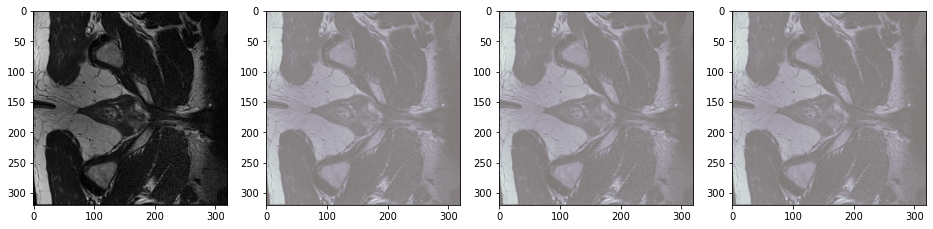

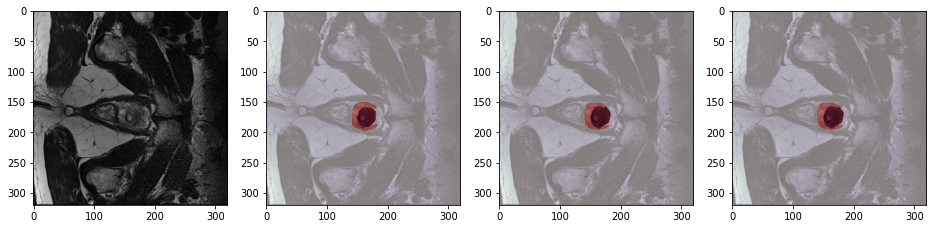

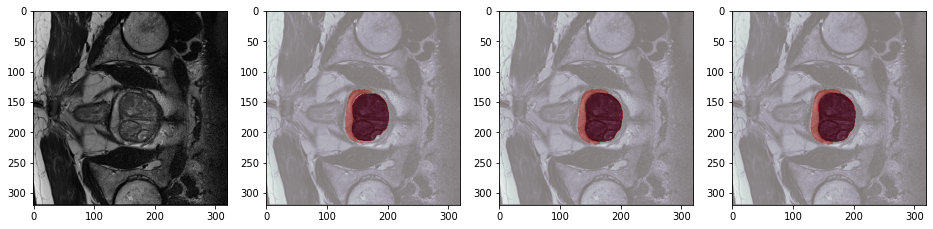

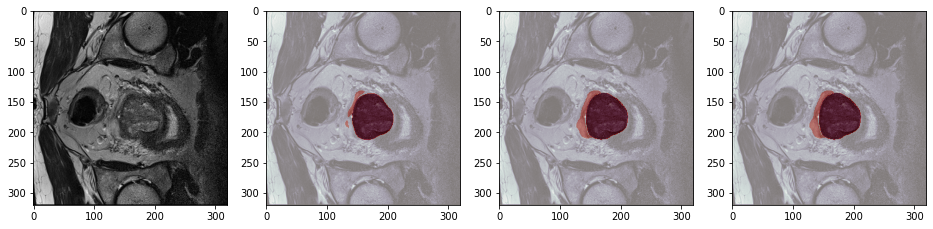

In [ ]:
img = nib.load('/content/drive/MyDrive/AI-Medic/Prostate/Task05_Prostate/imagesTs/prostate_03.nii.gz').get_fdata()
label_best = nib.load('/content/drive/MyDrive/AI-Medic/Prostate/Task05_Prostate/labelsTs_best/prostate_03.nii.gz').get_fdata()
label_mean = nib.load('/content/drive/MyDrive/AI-Medic/Prostate/Task05_Prostate/labelsTs_mean/prostate_03.nii.gz').get_fdata()
label_weighted = nib.load('/content/drive/MyDrive/AI-Medic/Prostate/Task05_Prostate/labelsTs_weighted/prostate_03.nii.gz').get_fdata()
for idx in range(0,img.shape[2],5):
  plt.figure(figsize=(16,64))
  plt.subplot(1,4,1)
  plt.imshow(img[:,:,idx,0], cmap='gray')
  plt.subplot(1,4,2)
  plt.imshow(img[:,:,idx,0], cmap='bone')
  plt.imshow(label_best[:,:,idx], alpha=0.5, cmap='Reds')
  plt.subplot(1,4,3)
  plt.imshow(img[:,:,idx,0], cmap='bone')
  plt.imshow(label_mean[:,:,idx], alpha=0.5, cmap='Reds')
  plt.subplot(1,4,4)
  plt.imshow(img[:,:,idx,0], cmap='bone')
  plt.imshow(label_weighted[:,:,idx], alpha=0.5, cmap='Reds')
  plt.show()